# MAWI Density-based clustering analysis

In [1]:
from sklearn import metrics
from sklearn.cluster import OPTICS
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import hdbscan
import pandas as pd
import numpy as np
import pylab as py
import matplotlib.pyplot as plt
import glob

from matplotlib.cm import get_cmap
import matplotlib
# for condense trees in hdbscan
import seaborn as sns

%matplotlib inline

#R python libraries to compute cdbw
from rpy2.robjects import r, pandas2ri
from rpy2.robjects.packages import importr
import rpy2.robjects as ro
pandas2ri.activate()
fpc = importr('fpc')

/home/big-dama/anaconda3/lib/python3.7/site-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)
/home/big-dama/anaconda3/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [7]:
ground_truth_pd_loc = 'datasets/ground_truth_pd_052016.csv'
ground_truth_pd_binary_loc = 'datasets/ground_truth_pd_binary_052016_filtered_tables.csv'
mawi_features_052016_standard_scaled_106_loc = 'datasets/mawi_features_052016_standard_scaled_106_thesis.csv'
mawi_features_052016_loc = 'datasets/mawi_features_052016_thesis.csv'

ground_truth_pd = pd.read_csv(ground_truth_pd_loc, index_col=False)
ground_truth_pd_filtered = ground_truth_pd[~ground_truth_pd['table_name'].isin(['a20160509070000a', 'a20160517070000a', 'a20160526070000a'])]
ground_truth_pd_binary = pd.read_csv(ground_truth_pd_binary_loc, index_col=False)    
ground_truth_pd_binary_filtered = ground_truth_pd_binary[~ground_truth_pd_binary['table_name'].isin(['a20160509070000a', 'a20160517070000a', 'a20160526070000a'])]

reorderred_cols = ['table_name','dos','net_scan_tcp','net_scan_udp','netw_scan_icmp','port_scan','ipv6_tunneling','alpha_flow','multipoint','http','other','unknown','DDoSIC','sptpDoSSYN','ptpDoSSYN','sptpDoSIC','DDoSSYN','ntscACKt','dntscSYN','ntscSYN','ntscSYNt139445','sntscSYNt','ntscSYNt','ntscACK','ntscTCPRSTACKrp','ntscUDPICdurp','ptpposcaUDP','ntscUDPUDPICrp','ntscUDPUDPrp','ntscUDP','ntscICec','ipv46tun','ipv4gretun','malphfl','heavy_hitter','point_to_point','salphfl','alphfl','alphflHTTP','ptmpHTTP','ptmplaHTTP','mptpHTTP','mptplaHTTP','ptmpla','mptpla','mptmp','mptp','ptmp','icmp_error','ttl_error','empty']
ground_truth_pd_filtered = ground_truth_pd_filtered[reorderred_cols[::-1]]
#ground_truth_pd_filtered.drop(columns = 'table_name',inplace=True)

mawi_features_052016_pd_standard_scaled_106 = pd.read_csv(mawi_features_052016_standard_scaled_106_loc, index_col=False)
mawi_features_052016_pd = pd.read_csv(mawi_features_052016_loc, index_col=False)

In [3]:
reordered_columns_orig = ['vol(frame_len)', 'avg(frame_len)', 'avg(tcp_len)', 'avg(tcp_winsize)', 'avg(ip_len)', 'entropy(frame_len)', 'entropy(tcp_len)', 'entropy(tcp_winsize)','entropy(ip_len)','var(frame_len)', 'var(tcp_len)', 'var(tcp_winsize)', 'var(ip_len)','stddev(frame_len)', 'stddev(tcp_len)','stddev(tcp_winsize)', 'stddev(ip_len)', 'p50(frame_len)', 'p75(frame_len)', 'p50(ip_len)', 'p75(ip_len)','p50(tcp_len)','p1(tcp_winsize)','p2(tcp_winsize)','p5(tcp_winsize)','p10(tcp_winsize)', 'p15(tcp_winsize)', 'p20(tcp_winsize)', 'p25(tcp_winsize)', 'p50(tcp_winsize)', 'p75(tcp_winsize)', 'p97(tcp_winsize)', 'p99(tcp_winsize)','entropy(tcp_flags)', 'frac_tcpflag(tcp_flags_ack)','frac_tcpflag(tcp_flags_push)', 'frac_tcpflag(tcp_flags_syn)','entropy_1st_ip_octet(ip_dst)','entropy_2nd_ip_octet(ip_dst)', 'entropy_3rd_ip_octet(ip_dst)', 'entropy_4th_ip_octet(ip_dst)','entropy_1st_ip_octet(ip_src)', 'entropy_2nd_ip_octet(ip_src)','entropy_3rd_ip_octet(ip_src)','entropy_4th_ip_octet(ip_src)','frac_tcp(ip_proto)','frac_udp(ip_proto)', 'frac_gre(ip_proto)','frac_icmp(ip_proto)','entropy(icmp_type)','frac_echo_request(icmp_type)', 'frac_echo_reply(icmp_type)', 'frac_ipv4', 'frac_ipv6','frac_well_known(tcp_dstport)','frac_well_known(tcp_srcport)', 'frac_well_known(udp_dstport)','frac_well_known(udp_srcport)','frac_registered_ports(tcp_dstport)','frac_registered_ports(tcp_srcport)','frac_registered_ports(udp_dstport)','frac_registered_ports(udp_srcport)','frac_dynamic_ports(tcp_dstport)','frac_dynamic_ports(tcp_srcport)','frac_dynamic_ports(udp_dstport)','frac_dynamic_ports(udp_srcport)', 'frac_document_retrieval_tcp(tcp_dstport)','frac_document_retrieval_tcp(tcp_srcport)','frac_mail_tcp(tcp_dstport)', 'frac_mail_tcp(tcp_srcport)','frac_networking_udp(udp_dstport)','frac_networking_udp(udp_srcport)','frac_remote_access_tcp(tcp_dstport)','frac_remote_access_tcp(tcp_srcport)']

In [35]:
ground_truth_pd_binary_filtered['major_category_decimal_cluster_label_relabeled'].nunique()

24

# Section 1. Ground truth clustering evaluation 

First we want to have an idea what are the clustering performance evaluation metrics results for clusters extracted from MAWIlab anomaly detection.
We will compute DBCV (Density Based Clustering Validation) and CDbw (Composed Density between and within clusters) for ground truth.

To compute DBCV we will need hdbscan library for python and fpc library for R that contains cdbw algorithm. We will use rpy2 wrapper to use R in python.

Install R software (Rstudio can be run as server, looks like Spyder from Conda environment):
https://cran.ism.ac.jp/

    sudo add-apt-repository 'deb https://cloud.r-project.org/bin/linux/ubuntu trusty-cran35/'
    
    sudo apt-get install r-base
    R --version

run R and install fpc(possibly 'lattice' - not sure why needed) library:
    
    install.packages("fpc")
    install.packages("lattice")

install hdbscan library for python:

    conda install -c conda-forge hdbscan

hdbscan requires sklearn.metics.pairwise_distances_chunked which seems to be not available in default 0.19.2. scikit version of the current Anaconda version available for Cloudera

    sudo conda install scikit-learn=0.21.2

install R wrapper for python:

    conda install -c r rpy2
    
#### Note:
Sometimes there is an old version of R and it outputs errors like this:
    
    dpkg: dependency problems prevent configuration of r-base:
     r-base depends on r-base-core (>= 3.6.1-1trusty); however:
      Package r-base-core is not configured yet.
in thaht case this helps:

     sudo cp /etc/bash_completion.d/R /usr/share/bash-completion/completions/R
     sudo apt-get -f install

### Section 1.1. Datasets preparation for DBCV/CDbw computation

In [18]:
# major anomalies have cluster with size >=10
major_anomaly_labels = ground_truth_pd_binary['major_category_decimal_cluster_label_relabeled'].values + 1
X_major_anomaly = mawi_features_052016_pd_standard_scaled_106.values

# all anomalies include clusters that have <10 points - a minimum for CDBW computation
vc = ground_truth_pd_binary['sub_category_decimal_cluster_label_relabeled'].value_counts()
#cluster numbers(labels) with size <=10
small_clusters = vc[vc<10].index.tolist()
#index of rows that have small cluster label
small_clusters_indexes = ground_truth_pd_binary.index[ground_truth_pd_binary['sub_category_decimal_cluster_label_relabeled'].isin(small_clusters)].tolist()
# all rows except the small_clusters_indexes , for data+1 as R starts indexing with 1 not with 0 like Python
anomaly_labels = pd.DataFrame(ground_truth_pd_binary['sub_category_decimal_cluster_label_relabeled'][~ground_truth_pd_binary.index.isin(small_clusters_indexes)].values,columns=['sub_category_decimal_cluster_label_relabeled'])
X_anomaly = mawi_features_052016_pd_standard_scaled_106[~mawi_features_052016_pd_standard_scaled_106.index.isin(small_clusters_indexes)].values
# the number of cluster must be going continuously from i to n, there can't be any skipped cluster number(which we just created by deleting some clusters)
uq_labels = anomaly_labels['sub_category_decimal_cluster_label_relabeled'].unique()
for cluster_label,i in zip(uq_labels,range(len(uq_labels))):
    anomaly_labels['sub_category_decimal_cluster_label_relabeled'][anomaly_labels['sub_category_decimal_cluster_label_relabeled']==cluster_label] = i+10000000000000001
anomaly_labels['sub_category_decimal_cluster_label_relabeled'] = anomaly_labels['sub_category_decimal_cluster_label_relabeled']-10000000000000000
anomaly_labels = anomaly_labels.values

In [21]:
# r=10 is default, its the number of representative points in the cluster - also there can't be a cluster smaller than r value
major_anomaly_cdbw = fpc.cdbw(X_major_anomaly, major_anomaly_labels,r=10)
print('MAWI standard scaled filtered 106 features vs ground truth major anomaly clusters :\ncdbw : '+str(major_anomaly_cdbw[0][0])+', cohesion : '+str(major_anomaly_cdbw[1][0])+', compactness : '+str(major_anomaly_cdbw[2][0])+', sep : '+str(major_anomaly_cdbw[3][0]))

MAWI standard scaled filtered 106 features vs ground truth major anomaly clusters :
cdbw : 8.851384181029354e-07, cohesion : 0.00034196801801252176, compactness : 0.00034196530451023393, sep : 7.569089745005288


In [23]:
anomaly_cdbw = fpc.cdbw(X_anomaly, anomaly_labels,r=10)
print('MAWI standard scaled filtered 106 features vs ground truth anomaly clusters :\ncdbw : '+str(anomaly_cdbw[0][0])+', cohesion : '+str(anomaly_cdbw[1][0])+', compactness : '+str(anomaly_cdbw[2][0])+', sep : '+str(anomaly_cdbw[3][0]))

MAWI standard scaled filtered 106 features vs ground truth anomaly clusters :
cdbw : 1.1270565998225529e-05, cohesion : 0.001677029205996643, compactness : 0.001676691922167405, sep : 4.008222562863753


### Section 1.3. DBCV

In [24]:
#import hdbscan
# I must have computed this locally on my laptop due to issues with sci-kit version in Anaconda distribution for Cloudera
# so you have to believe me the numbers :)
major_anomaly_dbcv = hdbscan.validity_index(X_major_anomaly, major_anomaly_labels)
#major_anomaly_dbcv = -0.8710233750502937
print('MAWI standard scaled filtered 106 features vs ground truth major anomaly clusters :\ndbcv : '+str(major_anomaly_dbcv))

MAWI standard scaled filtered 106 features vs ground truth major anomaly clusters :
dbcv : -0.8819121678375734


In [36]:
#anomaly_dbcv = -0.7939083897281981
anomaly_dbcv = hdbscan.validity_index(X_anomaly, np.hstack(anomaly_labels))
print('MAWI standard scaled filtered 106 features vs ground truth anomaly clusters :\ndbcv : '+str(anomaly_dbcv))

MAWI standard scaled filtered 106 features vs ground truth anomaly clusters :
dbcv : -0.812042428740347


# Section 2. DBSCAN

## Section 2.1. KNN Epsilon estimation for DBSCAN

In [4]:
# rule of thumb 1 - minpts >=2*D ; number_of_neighbors = minpts-1 -> 2*D-1
n_nbrs1 = 2*len(mawi_features_052016_pd_standard_scaled_106.columns.values) - 1
nbrs1 = NearestNeighbors(n_neighbors=n_nbrs1).fit(mawi_features_052016_pd_standard_scaled_106.values)
distances1, indices1 = nbrs1.kneighbors(mawi_features_052016_pd_standard_scaled_106.values)
# rule of thumb 2 : minpts >= D+1 ; number_of_neighbors = minpts-1 -> D
n_nbrs2 = len(mawi_features_052016_pd_standard_scaled_106.columns.values)
nbrs2 = NearestNeighbors(n_neighbors=n_nbrs2).fit(mawi_features_052016_pd_standard_scaled_106.values)
distances2, indices2 = nbrs2.kneighbors(mawi_features_052016_pd_standard_scaled_106.values)

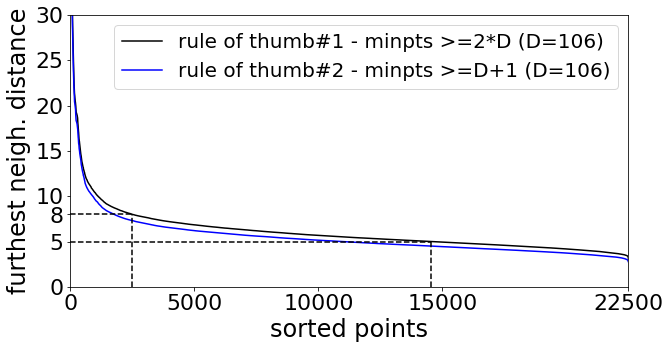

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(np.sort(distances1[:,n_nbrs1-1])[::-1], color='black')
ax.plot(np.sort(distances2[:,n_nbrs2-1])[::-1], color='blue')
ax.set_xlim([0,len(mawi_features_052016_pd_standard_scaled_106)])
ax.set_ylim([0,30])

arr = np.sort(distances1[:,n_nbrs1-1])[::-1]
v_low = 5
v_high = 8
idx_low = (np.abs(arr - v_low)).argmin()
idx_high = (np.abs(arr - v_high)).argmin()

ax.axhline(y=5, xmin=0, xmax=idx_low/len(arr),linestyle='--',color='black')
ax.axhline(y=8, xmin=0, xmax=idx_high/len(arr),linestyle='--',color='black')
ax.axvline(x=idx_low, ymin=0, ymax=v_low/30,linestyle='--',color='black')
ax.axvline(x=idx_high, ymin=0, ymax=v_high/30,linestyle='--',color='black')

ax.set_yticks(list(ax.get_yticks()) + [8])
ax.set_xticks([0,5000,10000,15000,22497])
ax.set_xticklabels(['0','5000','10000','15000','22500'])
ax.tick_params(labelsize=22)
ax.set_xlabel('sorted points',size=24)
ax.set_ylabel('furthest neigh. distance',size=24)

ax.legend(['rule of thumb#1 - minpts >=2*D (D=' + str(len(mawi_features_052016_pd_standard_scaled_106.columns)) + ')'\
           ,'rule of thumb#2 - minpts >=D+1 (D=' + str(len(mawi_features_052016_pd_standard_scaled_106.columns)) + ')'], fontsize=20)
fig.savefig('plots/mawi106_k-dist_plots.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [13]:
print('Rule of thumb#1 50th percentile: ' +str(np.percentile(distances1[:,n_nbrs1-1],50)))
print('Rule of thumb#1 90th percentile: ' +str(np.percentile(distances1[:,n_nbrs1-1],90)))

Rule of thumb#1 50th percentile: 5.4663383486807975
Rule of thumb#1 90th percentile: 8.209427924880826


## Section 2.1. Clustering

In [3]:
labels_list = list()
min_samples_list = [107, 212]
eps_list = [5, 5.1, 5.2, 5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6, 6.1, 6.2, 6.3, 6.4, 6.5, 6.6, 6.7, 6.8, 6.9, 7, 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8, 7.9, 8]

for min_samples in min_samples_list:
    for eps in eps_list:
        print(eps)
        dbscan_clust = DBSCAN(eps=eps, min_samples=min_samples).fit(mawi_features_052016_pd_standard_scaled_106.values)
        labels_list.append(dbscan_clust.labels_)

In [16]:
min_samples_list_df = [min_samples_list[0] for i in range(len(eps_list))]
min_samples_list_df.extend([min_samples_list[1] for i in range(len(eps_list))])
eps_list.extend(eps_list)
mawi_dbscan_results = {'min_samples' : min_samples_list_df,
                       'eps' : eps_list,
                       'labels' : labels_list}
mawi_dbscan_results_df = pd.DataFrame(mawi_dbscan_results)
eps_list = [5, 5.1, 5.2, 5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6, 6.1, 6.2, 6.3, 6.4, 6.5, 6.6, 6.7, 6.8, 6.9, 7, 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8, 7.9, 8]

In [17]:
#mawi_dbscan_results_df.to_pickle('results/mawi106_dbscan_results_df_thesis.csv')
mawi_dbscan_results_df = pd.read_pickle('results/mawi106_dbscan_results_df_thesis.csv')

## Section 2.2. V-measure, DBCV, CDbW

In [4]:
cdbw_list = list()
cohesion_list = list()
compactness_list = list()
sep_list = list()
dbcv_list = list()
homogeneity_mc_list = list()
completeness_mc_list = list()
v_measure_mc_list = list()
homogeneity_list = list()
completeness_list = list()
v_measure_list = list()

noise_index_list = list()
clusters_index_list = list()
clusters_labels_list = list()

for labels,i in zip(mawi_dbscan_results['labels'],range(len(mawi_dbscan_results_df['labels']))):
    print(i)
    noise_index = np.where(labels==-1)[0]
    noise_index_list.append(noise_index)
    clusters_index = np.where(labels!=-1)[0]
    clusters_index_list.append(clusters_index)
    clusters_labels = labels[clusters_index]
    clusters_labels_list.append(clusters_labels)
    # major clusters v-measure
    hom,comp,vm = metrics.homogeneity_completeness_v_measure(ground_truth_pd_binary_filtered['major_category_decimal_cluster_label_relabeled'][clusters_index], clusters_labels)
    homogeneity_mc_list.append(hom)
    completeness_mc_list.append(comp)
    v_measure_mc_list.append(vm)

    # all clusters v-measure
    hom,comp,vm = metrics.homogeneity_completeness_v_measure(ground_truth_pd_binary_filtered['sub_category_decimal_cluster_label_relabeled'][clusters_index], clusters_labels)
    homogeneity_list.append(hom)
    completeness_list.append(comp)
    v_measure_list.append(vm)
    if len(np.unique(clusters_labels)) > 1 :
    # cluster_vector+1 -> as R uses numbering starting with 1 and not 0 as python,
        anomaly_cdbw = fpc.cdbw(mawi_features_052016_pd_standard_scaled_106.values[clusters_index], clusters_labels+1,r=10)
        cdbw_list.append(anomaly_cdbw[0][0])
        cohesion_list.append(anomaly_cdbw[1][0])
        compactness_list.append(anomaly_cdbw[2][0])
        sep_list.append(anomaly_cdbw[3][0])
        dbcv_list.append(hdbscan.validity_index(mawi_features_052016_pd_standard_scaled_106.values[clusters_index], clusters_labels))
    else:
        cdbw_list.append('NA')
        cohesion_list.append('NA')
        compactness_list.append('NA')
        sep_list.append('NA')
        dbcv_list.append('NA')

mawi_dbscan_results_df['Composed Density between and within clusters(cdbw)'] = cdbw_list
mawi_dbscan_results_df['Composed Density between and within clusters(cohesion)'] = cohesion_list
mawi_dbscan_results_df['Composed Density between and within clusters(compactness)'] = compactness_list
mawi_dbscan_results_df['Composed Density between and within clusters(sep)'] = sep_list
mawi_dbscan_results_df['Density Based Clustering Validation(dbcv)'] = dbcv_list
mawi_dbscan_results_df['homogeneity(major clusters)'] = homogeneity_mc_list
mawi_dbscan_results_df['completeness(major clusters)'] = completeness_mc_list
mawi_dbscan_results_df['v measure(major clusters)'] = v_measure_mc_list
mawi_dbscan_results_df['homogeneity'] = homogeneity_list
mawi_dbscan_results_df['completeness'] = completeness_list
mawi_dbscan_results_df['v measure'] = v_measure_list
mawi_dbscan_results_df['noise_index'] = noise_index_list
mawi_dbscan_results_df['clusters_index'] = clusters_index_list
mawi_dbscan_results_df['clusters_labels'] = clusters_labels_list

mawi_dbscan_results_df.to_pickle('results/mawi106_dbscan_results_df_eval_thesis.csv')

In [2]:
mawi_dbscan_results_df = pd.read_pickle('results/mawi106_dbscan_results_df_eval_thesis.csv')

# some clustering results contained only 1 cluster - it does not make sense to evaluate clustering of 1 cluster
mawi_dbscan_results_df['Composed Density between and within clusters(cdbw)'].replace('NA',0,inplace=True)
mawi_dbscan_results_df['Composed Density between and within clusters(cohesion)'].replace('NA',0,inplace=True)
mawi_dbscan_results_df['Composed Density between and within clusters(compactness)'].replace('NA',0,inplace=True)
mawi_dbscan_results_df['Composed Density between and within clusters(sep)'].replace('NA',0,inplace=True)
mawi_dbscan_results_df['Density Based Clustering Validation(dbcv)'].replace('NA',-1,inplace=True)
mawi_dbscan_results_df.set_index(['eps'], inplace= True)

In [3]:
print('Max CDbw for MinPts=212 (eps/value) :' + \
str(mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==212]['Composed Density between and within clusters(cdbw)'].idxmax()) \
+'/'+ str(mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==212]['Composed Density between and within clusters(cdbw)'].max()))

Max CDbw for MinPts=212 (eps/value) :5.9/3.5648434855426413e-06


Max DBCV for MinPts=212 (eps/value) :5.9/0.6972375931108825
Max DBCV for MinPts=107 (eps/value) :5.7/0.6852194977106822


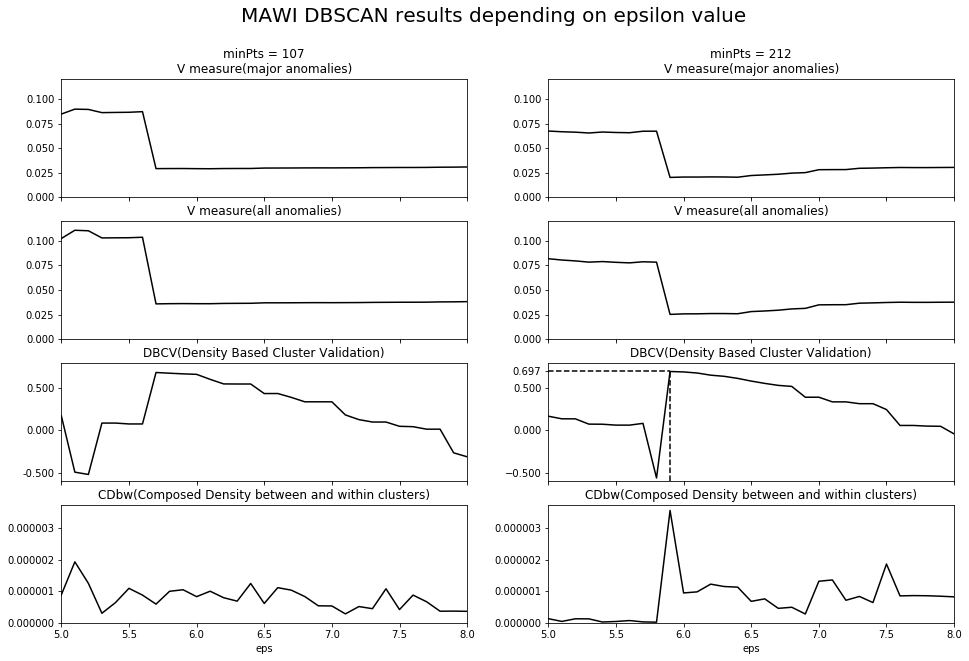

In [37]:
fig, ax = plt.subplots(4, 2, figsize=(16, 10))
fig.suptitle('MAWI DBSCAN results depending on epsilon value', size=20)
# clustering results for too low or too high values of Eps result in 1 cluster or noise and DBCV is 'NaN'; min value for DBCV is -1 -> replace('NaN', -1)
mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==107]['v measure(major clusters)'].plot(kind='line',ax=ax[0,0],sharex=True,title='minPts = 107\nV measure(major anomalies)',ylim=[0,0.12],color='black')
mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==107]['v measure'].plot(kind='line',ax=ax[1,0],sharex=True,title='V measure(all anomalies)',ylim=[0,0.12],color='black')
mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==107]['Density Based Clustering Validation(dbcv)'].plot(kind='line',ax=ax[2,0],sharex=True,title='DBCV(Density Based Cluster Validation)',ylim=[-0.6,0.8],color='black')
mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==107]['Composed Density between and within clusters(cdbw)'].plot(kind='line',ax=ax[3,0],sharex=True,title='CDbw(Composed Density between and within clusters)',ylim=[0,0.00000375],color='black')

mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==212]['v measure(major clusters)'].plot(kind='line',ax=ax[0,1],sharex=True,title='minPts = 212\nV measure(major anomalies)',ylim=[0,0.12],color='black')
mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==212]['v measure'].plot(kind='line',ax=ax[1,1],sharex=True,title='V measure(all anomalies)',ylim=[0,0.12],color='black')
mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==212]['Density Based Clustering Validation(dbcv)'].plot(kind='line',ax=ax[2,1],sharex=True,title='DBCV(Density Based Cluster Validation)',ylim=[-0.6,0.8],color='black')
ax[2,1].axvline(x=5.9, ymin=0, ymax=(0.6+0.6972385369957197)/1.4,linestyle='--',color='black')
ax[2,1].axhline(y=0.6972385369957197, xmin=0, xmax=0.9/3,linestyle='--',color='black')
ax[2,1].set_yticks(list(ax[2,1].get_yticks()) + [0.6972385369957197])
ax[2,0].set_yticklabels(['','-0.500','0.000','0.500'])
ax[2,1].set_ylim([-0.6,0.8])
mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==212]['Composed Density between and within clusters(cdbw)'].plot(kind='line',ax=ax[3,1],sharex=True,title='CDbw(Composed Density between and within clusters)',ylim=[0,0.00000375],color='black')

print('Max DBCV for MinPts=212 (eps/value) :' + \
str(mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==212]['Density Based Clustering Validation(dbcv)'].idxmax()) \
+'/'+ str(mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==212]['Density Based Clustering Validation(dbcv)'].max()))

print('Max DBCV for MinPts=107 (eps/value) :' + \
str(mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==107]['Density Based Clustering Validation(dbcv)'].idxmax()) \
+'/'+ str(mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==107]['Density Based Clustering Validation(dbcv)'].max()))

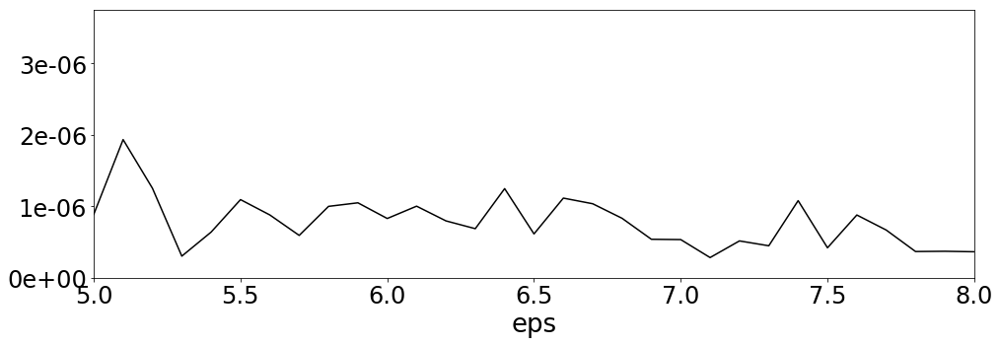

In [29]:
fig, ax = plt.subplots(1, 1, figsize=(16, 5))
ax.xaxis.label.set_size(26)
ax.tick_params(labelsize=24)
import matplotlib.ticker as mtick

# clustering results for too low or too high values of Eps result in 1 cluster or noise and DBCV is 'NaN'; min value for DBCV is -1 -> replace('NaN', -1)
# mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==107]['v measure(major clusters)'].plot(kind='line',ax=ax,sharex=True,ylim=[0,0.12],color='black')
# fig.savefig('plots/mawi106_vmeasure_majoranomalies_minpts107.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

# mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==107]['v measure'].plot(kind='line',ax=ax,sharex=True,ylim=[0,0.12],color='black')
# fig.savefig('plots/mawi106_vmeasure_anomalies_minpts107.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

# mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==107]['Density Based Clustering Validation(dbcv)'].plot(kind='line',ax=ax,sharex=True,ylim=[-0.6,0.8],color='black')
# fig.savefig('plots/mawi106_dbcv_minpts107.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==107]['Composed Density between and within clusters(cdbw)'].plot(kind='line',ax=ax,sharex=True,ylim=[0,0.00000375],color='black')
ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.e'))
fig.savefig('plots/mawi106_cdbw_minpts107.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)


# mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==212]['v measure(major clusters)'].plot(kind='line',ax=ax,sharex=True,ylim=[0,0.12],color='black')
# fig.savefig('plots/mawi106_vmeasure_majoranomalies_minpts212.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

# mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==212]['v measure'].plot(kind='line',ax=ax,sharex=True,ylim=[0,0.12],color='black')
# fig.savefig('plots/mawi106_vmeasure_anomalies_minpts212.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

# mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==212]['Density Based Clustering Validation(dbcv)'].plot(kind='line',ax=ax,sharex=True,ylim=[-0.6,0.8],color='black')
# ax.axvline(x=5.9, ymin=0, ymax=(0.6+0.6972385369957197)/1.4,linestyle='--',color='black')
# ax.axhline(y=0.6972385369957197, xmin=0, xmax=0.9/3,linestyle='--',color='black')
# ax.set_yticks(list(ax.get_yticks()) + [0.6972385369957197])
# ax.set_ylim([-0.6,0.8])
# #ax.set_yticklabels(['','-0.5','0','0.5','0.697',''])
# fig.savefig('plots/mawi106_dbcv_minpts212.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

# mawi_dbscan_results_df[mawi_dbscan_results_df['min_samples']==212]['Composed Density between and within clusters(cdbw)'].plot(kind='line',ax=ax,sharex=True,ylim=[0,0.00000375],color='black')
# ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.e'))
# fig.savefig('plots/mawi106_cdbw_minpts212.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

## Section 2.3. Cluster sizes

IMPORTANT NOTE: Whisker(end points of boxplots) show min/max values. By default whiskers show (Q3 + whis*IQR) and Q1 - whis*IQR. Beyond the whiskers, data are considered outliers and are drawn by default - we willturn it off to make the boxplots easier to read.

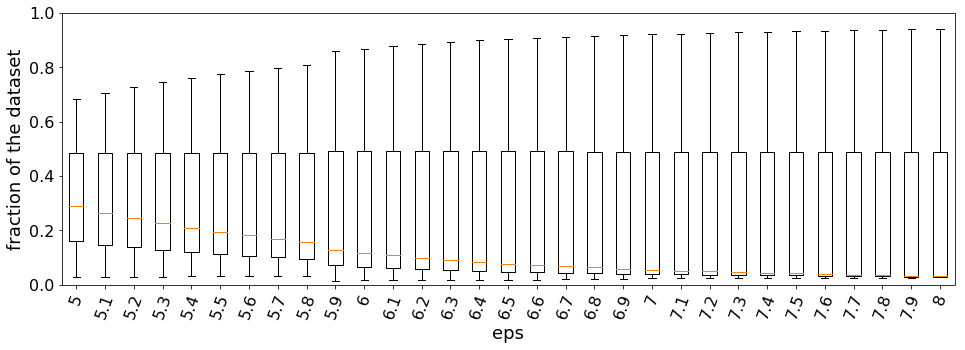

In [4]:
fig, ax = plt.subplots(1, 1, figsize=(16, 5))
eps_list = [5, 5.1, 5.2, 5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6, 6.1, 6.2, 6.3, 6.4, 6.5, 6.6, 6.7, 6.8, 6.9, 7, 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8, 7.9, 8]

boxplot_data = list()
for eps in eps_list:
    boxplot_data.append(np.unique(mawi_dbscan_results_df['labels'][mawi_dbscan_results_df['min_samples']==212][eps],return_counts=True)[1]/22497.0)
ax.boxplot(boxplot_data, whis='range', showfliers=False)    
ax.set_ylim(0,1)
ax.set_xticklabels(eps_list,rotation=70)
#ax.set_xlim(20.5,69.5)
ax.set_ylabel('fraction of the dataset')
ax.set_xlabel("eps")
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.tick_params(labelsize=16)
#ax.set_title("MAWI DBSCAN clusters sizes depending on Eps(minPts = 202)")
fig.savefig('plots/mawi106_dbscan_cluster_size_minpts212.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)
#plt.subplots_adjust(hspace = 0.35)

## Section 2.4. Outliers

DBSCAN classifies everything outsiede of the Epsilon neighborhood boundaries as Noise. Another way to itnerpret Noise is Outliers. We will analyse Oulier magnitude and consistency of sets of samples marked as outliers by Jaccard index.

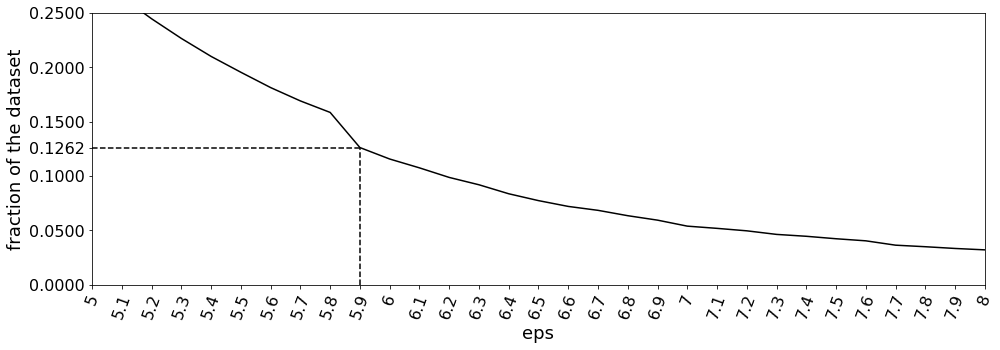

In [69]:
fig, ax = plt.subplots(1, 1, figsize=(16, 5))

plot_data = list()
for eps in eps_list:
    plot_data.append(len(mawi_dbscan_results_df['noise_index'][mawi_dbscan_results_df['min_samples']==212][eps])/22497.0)
ax.plot(plot_data,color='black')    
ax.set_ylim(0,1)
ax.set_xticks(np.arange(len(eps_list)))
ax.set_xticklabels(eps_list,rotation=70)
ax.set_ylim(0,0.25)
ax.set_xlim(0,30)
ax.set_ylabel('fraction of the dataset')
ax.set_xlabel("eps")
ax.axvline(x=9, ymin=0, ymax=plot_data[9]/0.25,linestyle='--',color='black')
ax.axhline(y=plot_data[9], xmin=0, xmax=9/30,linestyle='--',color='black')
ax.set_yticks(list(ax.get_yticks()) + [plot_data[9]])

ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.tick_params(labelsize=16)
#ax[1].set_title("MAWI DBSCAN noise/outlier magnitude depending on Eps(minPts = 202)")
fig.savefig('plots/mawi106_outlier_magnitude_minpts212.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)
#plt.subplots_adjust(hspace = 0.35)

## Section 2.5. DBSCAN clusters continuity + sizes

In [19]:
unique_clusters, counts = np.unique(mawi_dbscan_results_df['labels'][mawi_dbscan_results_df['min_samples']==212][5.9],return_counts=True)
counts = counts/float(len(mawi_features_052016_pd_standard_scaled_106))

print('Cluster counts DBSCAN, minpts=212, eps=5.9 :')
for label,count in zip(unique_clusters,counts):
    print('Cluster ' + str(label) + ' size : ' + str(count))

Cluster counts DBSCAN, minpts=212, eps=5.9 :
Cluster -1 size : 0.1261501533537805
Cluster 0 size : 0.8586478197092946
Cluster 1 size : 0.015202026936924923


Cluster min/max -1: 0.0011111111111111111/0.05333333333333334
5.333333333333334
Cluster min/max 0: 0.0011111111111111111/0.42
42.0
Cluster min/max 1: 0.0011111111111111111/0.017777777777777778
1.7777777777777777


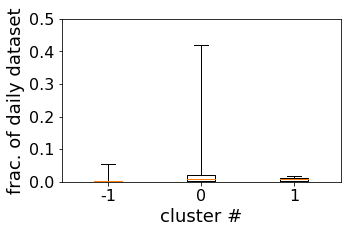

In [32]:
dataset = mawi_dbscan_results_df['labels'][mawi_dbscan_results_df['min_samples']==212][5.9].copy()
continuity_boxplot_list = list()
for uq_cl in unique_clusters:
    continuity_boxplot_temp = list()
    temp = 0
    for i in range(len(dataset)):
        # reset counter after every 900 samples
        if ((i>0) and (float(i//900) == (i/900))):
            if temp>0:
                continuity_boxplot_temp.append(temp/900)
            temp = 0
        if dataset[i]==uq_cl:
            temp+=1
        if dataset[i]!=uq_cl and temp>0:
            continuity_boxplot_temp.append(temp/900)
            temp = 0
    continuity_boxplot_list.append(continuity_boxplot_temp)

fig, ax = plt.subplots(1, 1, figsize=(5, 3))

boxplot_data = continuity_boxplot_list
ax.boxplot(boxplot_data, whis='range',showfliers=True)
#ax.set_ylim(0,0.1)
ax.set_xticklabels(unique_clusters)
#ax.set_xlim(0.5,len(unique_clusters)+0.5)
ax.set_ylabel('frac. of daily dataset')
ax.set_xlabel('cluster #')
#ax.set_title('MAWI OPTICS cluster continuity')
for i,cl in zip(boxplot_data,unique_clusters):
    print('Cluster min/max ' +str(cl)+ ': ' +str(min(i))+ '/' +str(max(i)))
    print(str(max(i)*100))
ax.set_ylim([0,0.5])
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.tick_params(labelsize=16)
fig.savefig('plots/mawi_dbscan_clusters_continuity.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

## Section 2.6. DBSCAN interpretation by feature values

In [8]:
reordered_columns_orig = ['vol(frame_len)','avg(frame_len)','avg(tcp_len)','avg(tcp_winsize)','avg(ip_len)','entropy(frame_len)','entropy(tcp_len)','entropy(tcp_winsize)','entropy(ip_len)','var(frame_len)','var(tcp_len)','var(tcp_winsize)','var(ip_len)','stddev(frame_len)','stddev(tcp_len)','stddev(tcp_winsize)','stddev(ip_len)','p50(frame_len)','p75(frame_len)','p50(ip_len)','p75(ip_len)','p50(tcp_len)','p1(tcp_winsize)','p2(tcp_winsize)','p5(tcp_winsize)','p10(tcp_winsize)','p15(tcp_winsize)','p20(tcp_winsize)','p25(tcp_winsize)','p50(tcp_winsize)','p75(tcp_winsize)','p97(tcp_winsize)','p99(tcp_winsize)','entropy(tcp_flags)','frac_tcpflag(tcp_flags_ack)','frac_tcpflag(tcp_flags_push)','frac_tcpflag(tcp_flags_syn)','frac_tcp(ip_proto)','frac_udp(ip_proto)','frac_gre(ip_proto)','frac_icmp(ip_proto)','entropy(icmp_type)','frac_echo_request(icmp_type)','frac_echo_reply(icmp_type)','frac_ipv4','frac_ipv6','frac_well_known(tcp_dstport)','frac_well_known(tcp_srcport)','frac_registered_ports(tcp_dstport)','frac_registered_ports(tcp_srcport)','frac_dynamic_ports(tcp_dstport)','frac_dynamic_ports(tcp_srcport)','frac_document_retrieval_tcp(tcp_dstport)','frac_document_retrieval_tcp(tcp_srcport)','frac_mail_tcp(tcp_dstport)','frac_mail_tcp(tcp_srcport)','frac_remote_access_tcp(tcp_dstport)','frac_remote_access_tcp(tcp_srcport)','frac_well_known(udp_dstport)','frac_well_known(udp_srcport)','frac_registered_ports(udp_dstport)','frac_registered_ports(udp_srcport)','frac_dynamic_ports(udp_dstport)','frac_dynamic_ports(udp_srcport)','frac_networking_udp(udp_dstport)','frac_networking_udp(udp_srcport)','entropy_1st_ip_octet(ip_dst)','entropy_2nd_ip_octet(ip_dst)','entropy_3rd_ip_octet(ip_dst)','entropy_4th_ip_octet(ip_dst)','entropy_1st_ip_octet(ip_src)','entropy_2nd_ip_octet(ip_src)','entropy_3rd_ip_octet(ip_src)','entropy_4th_ip_octet(ip_src)']
reordered_columns_orig_boxplot = ['vol(frame_len)','avg(frame_len)','avg(tcp_len)','avg(tcp_winsize)','avg(ip_len)','entropy(frame_len)','entropy(tcp_len)','entropy(tcp_winsize)','entropy(ip_len)','var(frame_len)','var(tcp_len)','var(tcp_winsize)','var(ip_len)','stddev(frame_len)','stddev(tcp_len)','stddev(tcp_winsize)','stddev(ip_len)','p50(frame_len)','p75(frame_len)','p50(ip_len)','p75(ip_len)','p50(tcp_len)','p1(tcp_winsize)','p2(tcp_winsize)','p5(tcp_winsize)','p10(tcp_winsize)','p15(tcp_winsize)','p20(tcp_winsize)','p25(tcp_winsize)','p50(tcp_winsize)','p75(tcp_winsize)','p97(tcp_winsize)','p99(tcp_winsize)','entropy(tcp_flags)','frac(tcp_flags_ack)','frac(tcp_flags_push)','frac(tcp_flags_syn)','frac(tcp)','frac(udp)','frac(gre)','frac(icmp)','entropy(icmp_type)','frac(icmp_echo_request)','frac(icmp_echo_reply)','frac(ipv4)','frac(ipv6)','frac(tcp_well_known_dst)','frac(tcp_well_known_src)','frac(tcp_reg_ports_dst)','frac(tcp_reg_ports_src)','frac(tcp_dyn_ports_dst)','frac(tcp_dyn_ports_src)','frac(tcp_doc_retrieval_tcp_dst)','frac(tcp_doc_retrieval_tcp_src)','frac(tcp_mail_dst)','frac(tcp_mail_src)','frac(tcp_remote_acc_dst)','frac(tcp_remote_acc_src)','frac(udp_well_known_dst)','frac(udp_well_known_src)','frac(udp_reg_ports_dst)','frac(udp_reg_ports_src)','frac(udp_dyn_ports_dst)','frac(udp_dyn_ports_src)','frac(udp_networking_dst)','frac(udp_networking_src)','entropy_1st_ip_octet(dst)','entropy_2nd_ip_octet(dst)','entropy_3rd_ip_octet(dst)','entropy_4th_ip_octet(dst)','entropy_1st_ip_octet(src)','entropy_2nd_ip_octet(src)','entropy_3rd_ip_octet(src)','entropy_4th_ip_octet(src)']
reordered_columns_boxplot = reordered_columns_orig_boxplot[::-1]
# reverse the list for boxplots
reordered_columns = reordered_columns_orig[::-1]

# define features and groudn truth datasets we will use
dataset = mawi_features_052016_pd_standard_scaled_106[reordered_columns].copy()
dataset['label'] = mawi_dbscan_results_df['labels'][mawi_dbscan_results_df['min_samples']==212][5.9].copy()

# I guess there is some issue in scikit optics implemenation as for xi values <0.05 it outputs only labels [0,-1] - 
# -1 should be noise, but at the sametim eit creates hierarchy that is simialr to ELKI results(no noise flag)
# we need to label dataset ourselves - we start from the end


# add cluster labels also to ground truth dataset
ground_truth_pd_filtered['label'] = dataset['label'].values.copy()

# "normal" - largest cluster
largest_cluster = dataset['label'].value_counts()[:1].index[0]    

# mean feature values for each cluster
clusters_interpretation_features = dataset.groupby('label').mean()

#subtract largest cluster features average values from cluster feaures
largest_cluster_features = clusters_interpretation_features.loc[largest_cluster]
clusters_interpretation_features_norm = clusters_interpretation_features.copy()
for index in clusters_interpretation_features.index.values:
    clusters_interpretation_features_norm.loc[index] = clusters_interpretation_features.loc[index].sub(largest_cluster_features)

# clusters interpretation through anomalies detected by MAWILab    
clusters_interpretation_anomalies = ground_truth_pd_filtered.groupby('label').mean()

#normalize cluster anomaly average values according to largest cluster
largest_cluster_anomalies = clusters_interpretation_anomalies.loc[largest_cluster]
clusters_interpretation_anomalies_norm = clusters_interpretation_anomalies.copy()
for index in clusters_interpretation_anomalies.index.values:
    clusters_interpretation_anomalies_norm.loc[index] = clusters_interpretation_anomalies.loc[index].div(largest_cluster_anomalies)

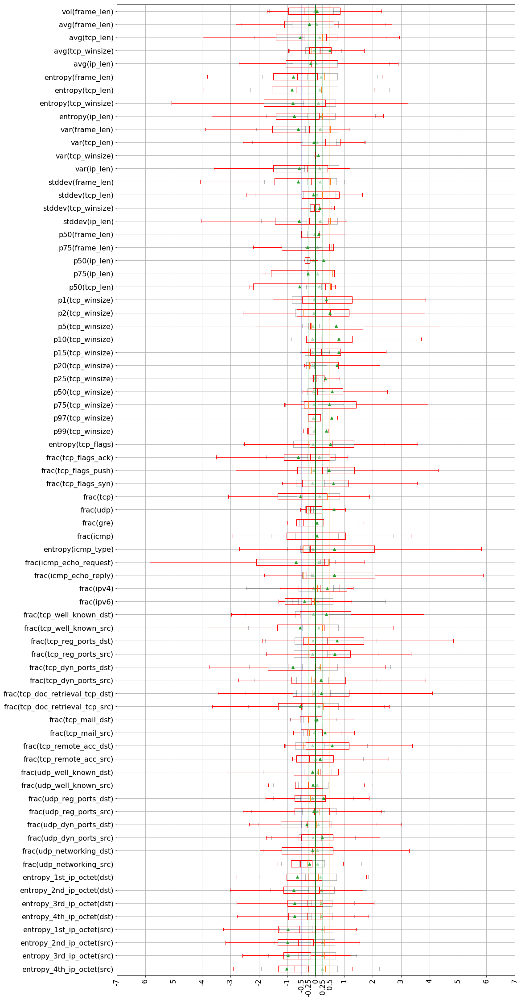

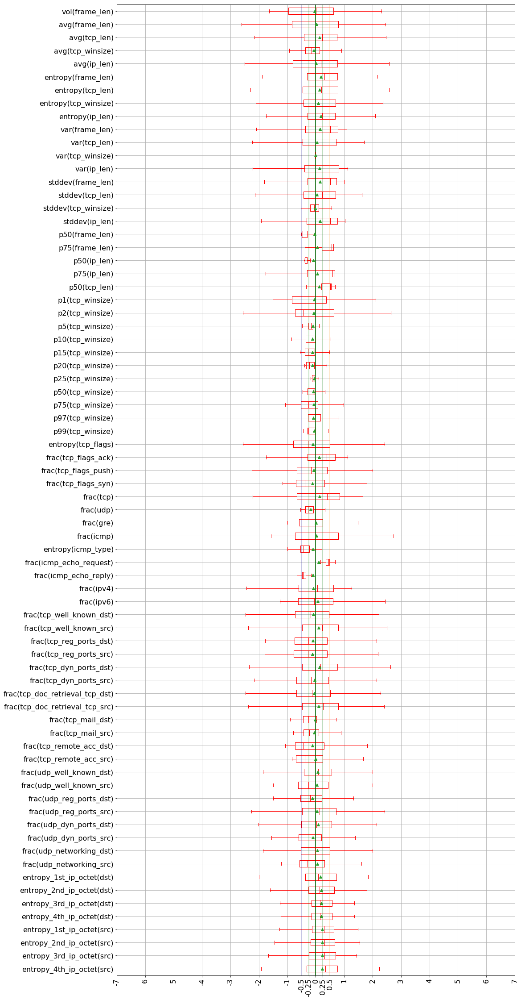

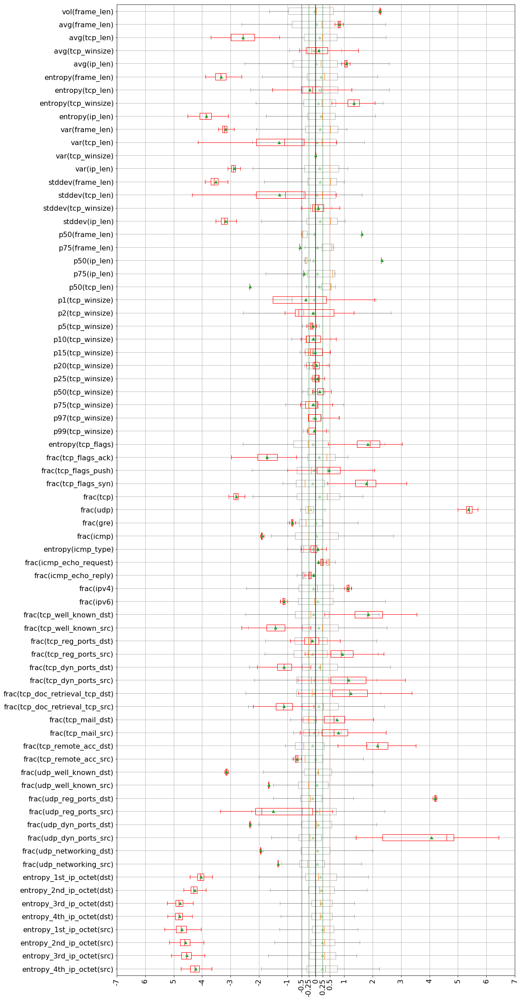

In [6]:
# I used pandas boxplot as its faster, I need less parameters and it puts grid/features names
for i in range(-1,2):
    fig, ax = plt.subplots(1, 1, figsize=(16,40), sharex=True)
    # I use matplotlib boxplot as I couldnt figure out how to make pandas boxplot transparent
    boxplot = ax.boxplot(dataset[dataset['label']==largest_cluster][dataset.columns[:-1]].values, vert=False,showfliers=False,boxprops=dict(alpha=.3),whiskerprops=dict(alpha=.3),capprops=dict(alpha=.3),meanprops=dict(alpha=.3),showmeans=True)
    dataset[dataset['label']==i][dataset.columns[:-1]].plot(fontsize = 16,kind='box',color=dict(boxes='red', whiskers='red', medians='red', caps='red'),vert=False,showfliers=False,ax=ax,grid=True,showmeans=True)
    ax.set_xlim([-7,7])
    ax.set_xticks([-7,-6,-5,-4,-3,-2,-1,-0.5,-0.25,0,0.25,0.5,1,2,3,4,5,6,7])
    ax.set_xticklabels(['-7','6','5','-4','-3','-2','-1','-0.5','-0.25','0','0.25','0.5','1','2','3','4','5','6','7'],rotation=90)
    ax.axvline(0.5, color='darkorange',alpha=.3)
    ax.axvline(0.25, color='green',alpha=.3)
    ax.axvline(-0.5, color='darkblue',alpha=.3)
    ax.axvline(-0.25, color='green',alpha=.3)
    ax.axvline(0, color='darkgreen')
    ax.set_yticklabels(reordered_columns_boxplot)
    fig.savefig('plots/mawi106_dbscan212_eps5_9_cluster_'+str(i)+'_feature_interpretation.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [40]:
# .T - table is transposed, we see features in rows
# midpoint of background gradient can't be set to fix values, i.e. 1, it wan be only shifted by custome functions in interval [0,1] for whole table
# axis=1 colormap is applied rowise
# 
clusters_interpretation_features[reordered_columns_orig].T.style.background_gradient(cmap='coolwarm',axis=1)

label,-1,0,1
vol(frame_len),0.034785,-0.044961,2.25085
avg(frame_len),-0.228722,0.0189037,0.830267
avg(tcp_len),-0.559374,0.127568,-2.56352
avg(tcp_winsize),0.5005,-0.0752149,0.0950451
avg(ip_len),-0.176308,0.00693724,1.07122
entropy(frame_len),-0.791625,0.175266,-3.33034
entropy(tcp_len),-0.833266,0.126116,-0.208709
entropy(tcp_winsize),-0.802681,0.0942181,1.33917
entropy(ip_len),-0.757724,0.179386,-3.8444
var(frame_len),-0.615833,0.146658,-3.17329


## Section 2.7. DBSCAN Interpretation by MAWIlab anomaly magnitudes

In [9]:
len(ground_truth_pd_filtered.columns)

52

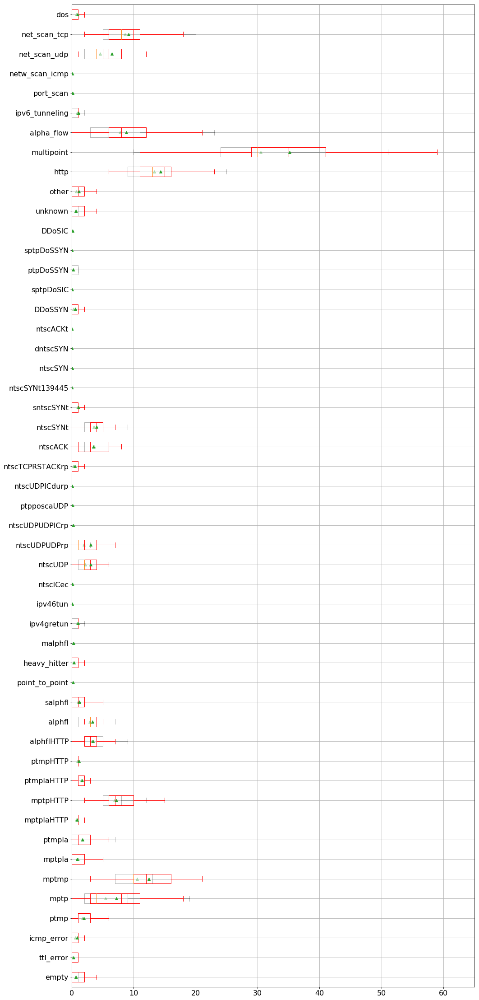

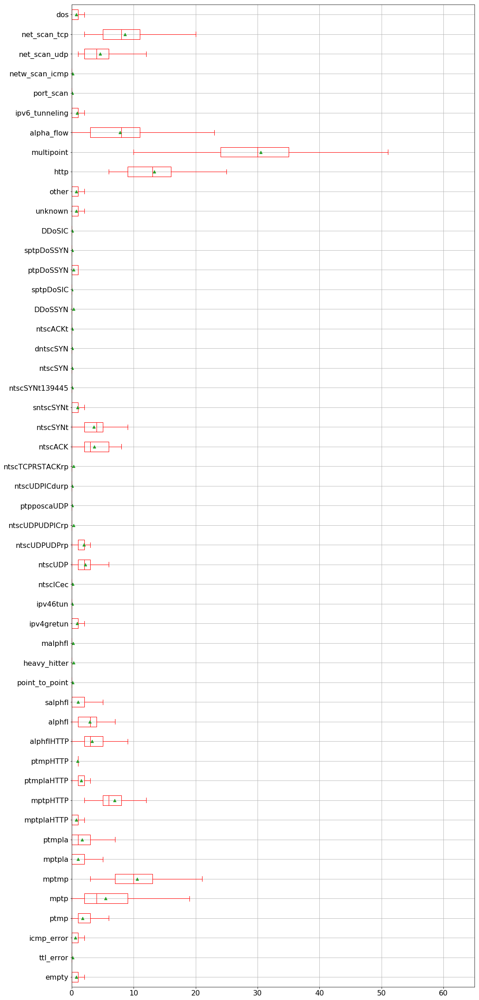

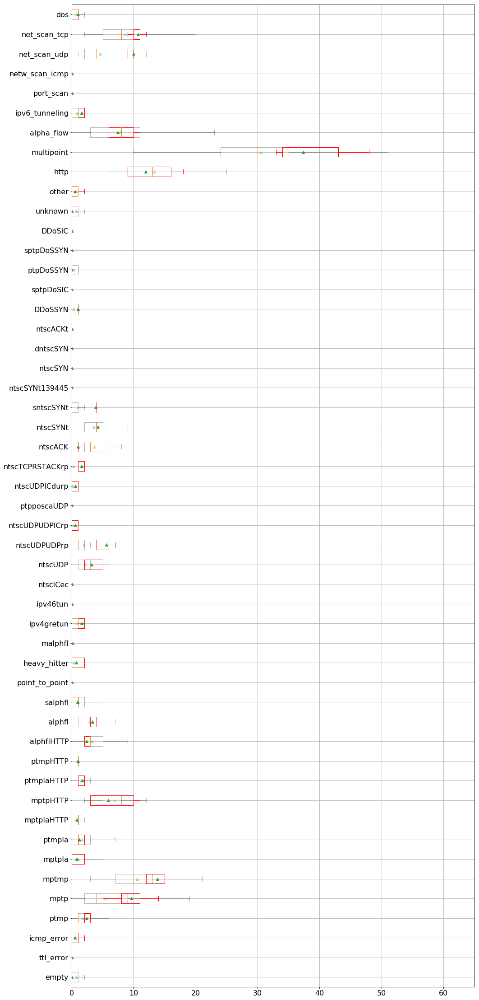

In [11]:
# there is no 'port_scan' major label in a give dataset, so I am filtering it out from boxplot
#major_labels = ['unknown', 'other', 'http', 'multipoint', 'alpha_flow','ipv6_tunneling', 'netw_scan_icmp', 'net_scan_udp','net_scan_tcp', 'dos']
for i in range(-1,2):
    fig, ax = plt.subplots(1, 1, figsize=(16,40) , sharex=True)
    boxplot = ax.boxplot(ground_truth_pd_filtered[ground_truth_pd_filtered['label']==largest_cluster][ground_truth_pd_filtered.columns[:-2]].values, vert=False,showfliers=False,boxprops=dict(alpha=.3),whiskerprops=dict(alpha=.3),capprops=dict(alpha=.3),meanprops=dict(alpha=.3),showmeans=True)
    ground_truth_pd_filtered[ground_truth_pd_filtered['label']==i][ground_truth_pd_filtered.columns[:-2]].plot(fontsize = 16, kind='box',color=dict(boxes='red', whiskers='red', medians='red', caps='red'),vert=False,showfliers=False,ax=ax,grid=True,showmeans=True)
    ax.set_xlim([0,65])
    fig.savefig('plots/mawi106_dbscan212_eps5_9_cluster_'+str(i)+'_anomaly_interpretation.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [42]:
clusters_interpretation_anomalies_norm[clusters_interpretation_anomalies_norm.columns[::-1]].T.style.background_gradient(cmap='coolwarm',axis=1)#.apply()

label,-1,0,1
dos,1.35472,1,1.43781
net_scan_tcp,1.06306,1,1.24237
net_scan_udp,1.41375,1,2.17524
netw_scan_icmp,0.68232,1,0
port_scan,1.43469,1,0
ipv6_tunneling,1.20974,1,1.80572
alpha_flow,1.127,1,0.952324
multipoint,1.15236,1,1.22415
http,1.07316,1,0.893252
other,1.53937,1,0.721339


# Section 3. OPTICS

## Section 3.1. OPTICS computation in scikit v0.21.2

In [7]:
ordered_reachability_list = list()
ordered_labels_list = list()
ordered_core_distances_list = list()

reachability_list = list()
labels_list = list()
core_distances_list = list()

cluster_hierarchy_list = list()
samples_ordering_list = list()
xi_list = [0.0005,0.0006,0.0007,0.0008,0.0009,0.001,0.002,0.003,0.004,0.005,0.006,0.007,0.008,0.009,0.01,0.02,0.05]

# min_cluster_size value is used during cluster extraction - ELKI does not support this, with value 10 we get better granularity of smaller clusters
# the idea(I think) is that we calculate DBSCAN by minpts value, take eps=Inf, compute reachability and then extarct clusters
for xi in xi_list:
    print(str(xi))
    optics_clust = OPTICS(min_samples=202, xi=xi, min_cluster_size=10, eps=6.14)
    optics_clust.fit(mawi_features_052016_pd_standard_scaled_101.values)

    ordered_reachability_list.append(optics_clust.reachability_[optics_clust.ordering_])
    ordered_labels_list.append(optics_clust.labels_[optics_clust.ordering_])
    ordered_core_distances_list.append(optics_clust.core_distances_[optics_clust.ordering_])

    reachability_list.append(optics_clust.reachability_)
    labels_list.append(optics_clust.labels_)
    core_distances_list.append(optics_clust.core_distances_)

    cluster_hierarchy_list.append(optics_clust.cluster_hierarchy_)
    samples_ordering_list.append(optics_clust.ordering_)

# save/load results
mawi_optics_results = {'xi' : xi_list,
                       'ordered_samples' : samples_ordering_list,
                       'ordered_reachability' : ordered_reachability_list,
                       'ordered_core_distances' : ordered_core_distances_list,
                       'ordered_clusters_labels' : ordered_labels_list,
                       'reachability' : reachability_list,
                       'core_distances' : core_distances_list,
                       'clusters_labels' : labels_list,
                       'cluster_hierarchy' : cluster_hierarchy_list}
mawi_optics_results_df = pd.DataFrame(mawi_optics_results)

In [44]:
#mawi_optics_results_df.to_pickle('results/mawi106_optics_ms212_mcl10_results_df_orig.csv')
mawi_optics_results_df = pd.read_pickle('results/mawi106_optics_ms212_mcl10_results_df_orig.csv')

## Section 3.2. scikit v0.21.2 OPTICS results adjustments

Labels are not correctly assigned to OPTICS results in v0.21.2. but the hierarchy is same as in ELKI and I dedicded to  adjust scikit results as it's easiet to add new columns and recompute values than rerun ELKI.

In [45]:
# ordering is same for every result, only hierarchy -> ordered_clusters_labels and clusters_labels are different
ordered_labels_list = list()
for clusters_hierarchy in mawi_optics_results_df['cluster_hierarchy']:
    temp_labels = np.zeros(22497)
    for cluster,i in zip(clusters_hierarchy[::-1],range(-1,len(clusters_hierarchy)-1)):
        temp_labels[cluster[0]:cluster[1]] = i
    ordered_labels_list.append(temp_labels.astype(int))    
mawi_optics_results_df['ordered_clusters_labels'] = ordered_labels_list

In [12]:
#mawi_optics_results_df.to_pickle('results/mawi106_optics_ms212_mcl10_results_df.csv')
mawi_optics_results_df = pd.read_pickle('results/mawi106_optics_ms212_mcl10_results_df.csv')

## Section 3.3. Visualization of OPTICS results - reachability plots

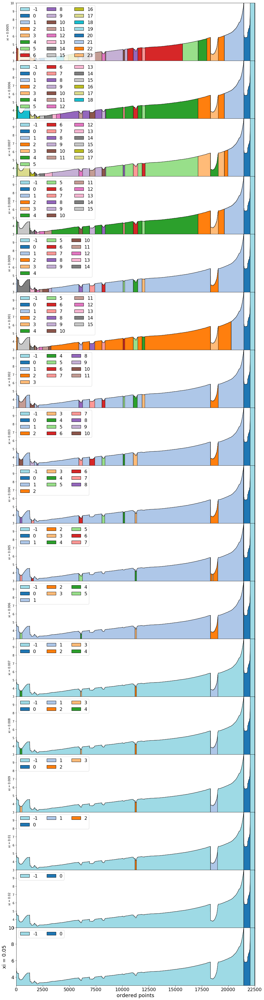

In [47]:
# list of colormapshttps://matplotlib.org/3.1.1/tutorials/colors/colormaps.html
import matplotlib.patches as mpatches
cmap = get_cmap('tab20')  # type: matplotlib.colors.ListedColormap
colors = cmap.colors  # type: list

fig, ax = plt.subplots(len(mawi_optics_results_df['xi']), 1, figsize=(15,60) , sharex=True)

for j in range(len(mawi_optics_results_df['xi'])):
    ax[j].plot(mawi_optics_results_df['ordered_reachability'][j],color='black',linewidth=0.5)
    ax[j].set_xlim([0, len(mawi_optics_results_df['ordered_reachability'][j])])
    ax[j].set_ylabel('xi = ' + str(mawi_optics_results_df['xi'][j]))
    ax[j].set_ylim([3,10])
    ax[j].set_xlabel('ordered points',size=12)
    #ax[j].set_ylabel('reachability',size=12)

    if j>0:
        plt.setp(ax[j].get_yticklabels()[-1], visible=False)
    
    # start color filling from parents to children - ie. from back to front
    legend_patchlist = list()
    pie_color_list = list()
    for i in np.unique(mawi_optics_results_df['ordered_clusters_labels'][j]):
        # np.mod cycles through the color set in case there is more clusters than colors
        cluster_x_not = np.where(mawi_optics_results_df['ordered_clusters_labels'][j]!=i)[0]
        cluster_y = mawi_optics_results_df['ordered_reachability'][j].copy()
        cluster_y[cluster_x_not] = 0
        ax[j].fill_between(np.linspace(0,22496,22497,endpoint=True), cluster_y, where=cluster_y>0, interpolate=True, facecolor=colors[np.mod(i,len(colors))], edgecolor='black',linewidth=0.8)
        pie_color_list.append(colors[np.mod(i,len(colors))])
        patch = mpatches.Patch(facecolor=colors[np.mod(i,len(colors))], edgecolor='black', label=str(i))
        legend_patchlist.append(patch)
    ax[j].legend(handles=legend_patchlist,ncol=3,loc='upper left', fontsize=16)
plt.subplots_adjust(hspace = 0,top=0.92)
#fig.text(0.08, 0.5, 'reachability distance', va='center', rotation='vertical',size=12)
ax[j].xaxis.label.set_size(18)
ax[j].yaxis.label.set_size(18)
ax[j].tick_params(labelsize=16)
#fig.savefig('plots/mawi_optics_reachability_plot001.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

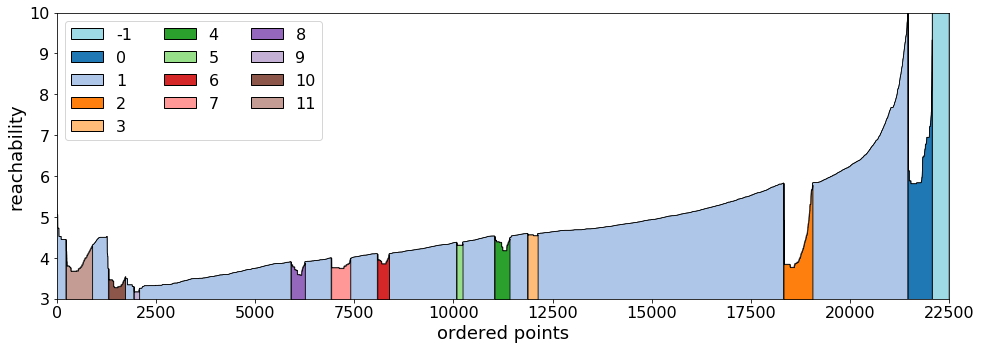

In [6]:
# list of colormapshttps://matplotlib.org/3.1.1/tutorials/colors/colormaps.html
import matplotlib.patches as mpatches

cmap = get_cmap('tab20')  # type: matplotlib.colors.ListedColormap
colors = cmap.colors  # type: list

fig, ax = plt.subplots(1, 1, figsize=(16,5) , sharex=True)

for j in [6]:
    ax.plot(mawi_optics_results_df['ordered_reachability'][j],color='black',linewidth=0.5)
    ax.set_xlim([0, len(mawi_optics_results_df['ordered_reachability'][j])])
    ax.set_ylabel('xi = ' + str(mawi_optics_results_df['xi'][j]))
    ax.set_ylim([3,10])
    ax.set_xlabel('ordered points',size=12)
    ax.set_ylabel('reachability',size=12)

    #if j>0:
    #    plt.setp(ax.get_yticklabels()[-1], visible=False)
    
    # start color filling from parents to children - ie. from back to front
    legend_patchlist = list()
    pie_color_list = list()
    for i in np.unique(mawi_optics_results_df['ordered_clusters_labels'][j]):
        # np.mod cycles through the color set in case there is more clusters than colors
        cluster_x_not = np.where(mawi_optics_results_df['ordered_clusters_labels'][j]!=i)[0]
        cluster_y = mawi_optics_results_df['ordered_reachability'][j].copy()
        cluster_y[cluster_x_not] = 0
        ax.fill_between(np.linspace(0,22496,22497,endpoint=True), cluster_y, where=cluster_y>0, interpolate=True, facecolor=colors[np.mod(i,len(colors))], edgecolor='black',linewidth=0.8)
        pie_color_list.append(colors[np.mod(i,len(colors))])
        patch = mpatches.Patch(facecolor=colors[np.mod(i,len(colors))], edgecolor='black', label=str(i))
        legend_patchlist.append(patch)
    ax.legend(handles=legend_patchlist,ncol=3,loc='upper left', fontsize=16)
plt.subplots_adjust(hspace = 0,top=0.92)
#fig.text(0.08, 0.5, 'reachability distance', va='center', rotation='vertical',size=12)
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.tick_params(labelsize=16)
fig.savefig('plots/mawi_optics_reachability_plot002.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

## Section 3.4. OPTICS clusters continuity + sizes

In [70]:
dataset = mawi_features_052016_pd_standard_scaled_106.iloc[mawi_optics_results_df[mawi_optics_results_df['xi'] == 0.002]['ordered_samples'].values[0],:].copy()
dataset['label'] = mawi_optics_results_df[mawi_optics_results_df['xi'] == 0.002]['ordered_clusters_labels'].values[0]
dataset.sort_index(inplace=True)

unique_clusters, unique_clusters_counts = np.unique(dataset['label'].values, return_counts=True)

continuity_boxplot_list = list()

for uq_cl in unique_clusters:
    continuity_boxplot_temp = list()
    temp = 0
    for i in range(len(dataset)):
        # reset counter after every 900 samples
        if ((i>0) and (float(i//900) == (i/900))):
            if temp>0:
                continuity_boxplot_temp.append(temp/900)
            temp = 0
        if dataset['label'][i]==uq_cl:
            temp+=1
        if dataset['label'][i]!=uq_cl and temp>0:
            continuity_boxplot_temp.append(temp/900)
            temp = 0
    continuity_boxplot_list.append(continuity_boxplot_temp)

In [71]:
print('Cluster counts :')
for i in range(len(unique_clusters_counts)):
    print('Cluster ' + str(unique_clusters[i]) + ' size : ' + str(unique_clusters_counts[i]*100/22497))

Cluster counts :
Cluster -1 size : 1.9335911454860648
Cluster 0 size : 2.7159176779126106
Cluster 1 size : 78.23709827977063
Cluster 2 size : 3.240432057607681
Cluster 3 size : 1.1245943903631594
Cluster 4 size : 1.6757789927545894
Cluster 5 size : 0.6756456416411077
Cluster 6 size : 1.311285949237676
Cluster 7 size : 2.142507889940881
Cluster 8 size : 1.5513179535049118
Cluster 9 size : 0.600080010668089
Cluster 10 size : 1.8580255145130462
Cluster 11 size : 2.9337244965995466


Cluster min/max -1: 0.0011111111111111111/0.042222222222222223
4.222222222222222
Cluster min/max 0: 0.0011111111111111111/0.01888888888888889
1.8888888888888888
Cluster min/max 1: 0.0011111111111111111/0.8622222222222222
86.22222222222223
Cluster min/max 2: 0.0011111111111111111/0.11333333333333333
11.333333333333332
Cluster min/max 3: 0.0011111111111111111/0.0077777777777777776
0.7777777777777778
Cluster min/max 4: 0.0011111111111111111/0.042222222222222223
4.222222222222222
Cluster min/max 5: 0.0011111111111111111/0.01
1.0
Cluster min/max 6: 0.0011111111111111111/0.04555555555555556
4.555555555555555
Cluster min/max 7: 0.0011111111111111111/0.02666666666666667
2.666666666666667
Cluster min/max 8: 0.0011111111111111111/0.01888888888888889
1.8888888888888888
Cluster min/max 9: 0.0011111111111111111/0.01
1.0
Cluster min/max 10: 0.0011111111111111111/0.03333333333333333
3.3333333333333335
Cluster min/max 11: 0.0011111111111111111/0.03888888888888889
3.888888888888889


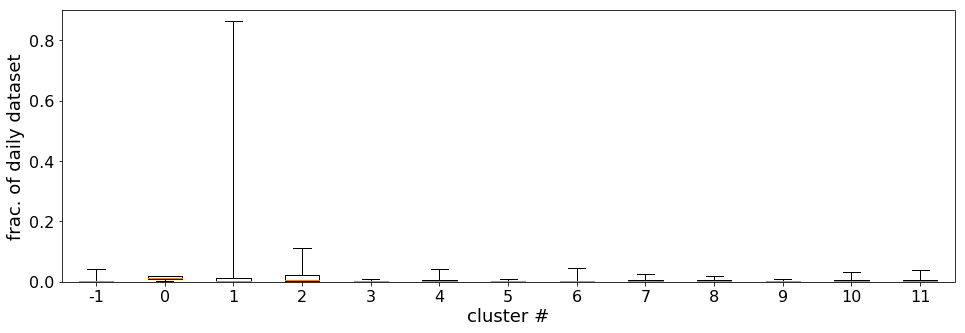

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(16, 5))

boxplot_data = continuity_boxplot_list
ax.boxplot(boxplot_data, whis='range',showfliers=True)
#ax.set_ylim(0,0.1)
ax.set_xticklabels(unique_clusters)
#ax.set_xlim(0.5,len(unique_clusters)+0.5)
ax.set_ylabel('frac. of daily dataset')
ax.set_xlabel('cluster #')
#ax.set_title('MAWI OPTICS cluster continuity')
for i,cl in zip(boxplot_data,unique_clusters):
    print('Cluster min/max ' +str(cl)+ ': ' +str(min(i))+ '/' +str(max(i)))
    print(str(max(i)*100))
ax.set_ylim([0,0.9])
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.tick_params(labelsize=16)
fig.savefig('plots/mawi_optics_clusters_continuity002.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [5]:
dataset = mawi_features_052016_pd_standard_scaled_106.iloc[mawi_optics_results_df[mawi_optics_results_df['xi'] == 0.002]['ordered_samples'].values[0],:].copy()
dataset['label'] = mawi_optics_results_df[mawi_optics_results_df['xi'] == 0.002]['ordered_clusters_labels'].values[0]
dataset.sort_index(inplace=True)

labels = dataset['label']
clusters_index = np.where(labels!=-1)[0]
clusters_labels = labels[clusters_index] 

hom,comp,vm = metrics.homogeneity_completeness_v_measure(ground_truth_pd_binary_filtered['major_category_decimal_cluster_label_relabeled'][clusters_index], clusters_labels)
print('OPTICS V-measure is ' + str(vm))

OPTICS V-measure is 0.2611001092801207


## Section 3.5. OPTICS Interpretation by feature values

In [13]:
reordered_columns_orig = ['vol(frame_len)', 'avg(frame_len)', 'avg(tcp_len)', 'avg(tcp_winsize)', 'avg(ip_len)', 'entropy(frame_len)', 'entropy(tcp_len)', 'entropy(tcp_winsize)','entropy(ip_len)','var(frame_len)', 'var(tcp_len)', 'var(tcp_winsize)', 'var(ip_len)','stddev(frame_len)', 'stddev(tcp_len)','stddev(tcp_winsize)', 'stddev(ip_len)', 'p50(frame_len)', 'p75(frame_len)', 'p50(ip_len)', 'p75(ip_len)','p50(tcp_len)','p1(tcp_winsize)','p2(tcp_winsize)','p5(tcp_winsize)','p10(tcp_winsize)', 'p15(tcp_winsize)', 'p20(tcp_winsize)', 'p25(tcp_winsize)', 'p50(tcp_winsize)', 'p75(tcp_winsize)', 'p97(tcp_winsize)', 'p99(tcp_winsize)','entropy(tcp_flags)', 'frac_tcpflag(tcp_flags_ack)','frac_tcpflag(tcp_flags_push)', 'frac_tcpflag(tcp_flags_syn)','entropy_1st_ip_octet(ip_dst)','entropy_2nd_ip_octet(ip_dst)', 'entropy_3rd_ip_octet(ip_dst)', 'entropy_4th_ip_octet(ip_dst)','entropy_1st_ip_octet(ip_src)', 'entropy_2nd_ip_octet(ip_src)','entropy_3rd_ip_octet(ip_src)','entropy_4th_ip_octet(ip_src)','frac_tcp(ip_proto)','frac_udp(ip_proto)', 'frac_gre(ip_proto)','frac_icmp(ip_proto)','entropy(icmp_type)','frac_echo_request(icmp_type)', 'frac_echo_reply(icmp_type)', 'frac_ipv4', 'frac_ipv6','frac_well_known(tcp_dstport)','frac_well_known(tcp_srcport)', 'frac_well_known(udp_dstport)','frac_well_known(udp_srcport)','frac_registered_ports(tcp_dstport)','frac_registered_ports(tcp_srcport)','frac_registered_ports(udp_dstport)','frac_registered_ports(udp_srcport)','frac_dynamic_ports(tcp_dstport)','frac_dynamic_ports(tcp_srcport)','frac_dynamic_ports(udp_dstport)','frac_dynamic_ports(udp_srcport)', 'frac_document_retrieval_tcp(tcp_dstport)','frac_document_retrieval_tcp(tcp_srcport)','frac_mail_tcp(tcp_dstport)', 'frac_mail_tcp(tcp_srcport)','frac_networking_udp(udp_dstport)','frac_networking_udp(udp_srcport)','frac_remote_access_tcp(tcp_dstport)','frac_remote_access_tcp(tcp_srcport)']
reordered_columns_orig_boxplot = ['vol(frame_len)','avg(frame_len)','avg(tcp_len)','avg(tcp_winsize)','avg(ip_len)','entropy(frame_len)','entropy(tcp_len)','entropy(tcp_winsize)','entropy(ip_len)','var(frame_len)','var(tcp_len)','var(tcp_winsize)','var(ip_len)','stddev(frame_len)','stddev(tcp_len)','stddev(tcp_winsize)','stddev(ip_len)','p50(frame_len)','p75(frame_len)','p50(ip_len)','p75(ip_len)','p50(tcp_len)','p1(tcp_winsize)','p2(tcp_winsize)','p5(tcp_winsize)','p10(tcp_winsize)','p15(tcp_winsize)','p20(tcp_winsize)','p25(tcp_winsize)','p50(tcp_winsize)','p75(tcp_winsize)','p97(tcp_winsize)','p99(tcp_winsize)','entropy(tcp_flags)','frac(tcp_flags_ack)','frac(tcp_flags_push)','frac(tcp_flags_syn)','frac(tcp)','frac(udp)','frac(gre)','frac(icmp)','entropy(icmp_type)','frac(icmp_echo_request)','frac(icmp_echo_reply)','frac(ipv4)','frac(ipv6)','frac(tcp_well_known_dst)','frac(tcp_well_known_src)','frac(tcp_reg_ports_dst)','frac(tcp_reg_ports_src)','frac(tcp_dyn_ports_dst)','frac(tcp_dyn_ports_src)','frac(tcp_doc_retrieval_tcp_dst)','frac(tcp_doc_retrieval_tcp_src)','frac(tcp_mail_dst)','frac(tcp_mail_src)','frac(tcp_remote_acc_dst)','frac(tcp_remote_acc_src)','frac(udp_well_known_dst)','frac(udp_well_known_src)','frac(udp_reg_ports_dst)','frac(udp_reg_ports_src)','frac(udp_dyn_ports_dst)','frac(udp_dyn_ports_src)','frac(udp_networking_dst)','frac(udp_networking_src)','entropy_1st_ip_octet(dst)','entropy_2nd_ip_octet(dst)','entropy_3rd_ip_octet(dst)','entropy_4th_ip_octet(dst)','entropy_1st_ip_octet(src)','entropy_2nd_ip_octet(src)','entropy_3rd_ip_octet(src)','entropy_4th_ip_octet(src)']
reordered_columns_boxplot = reordered_columns_orig_boxplot[::-1]
# reverse the list for boxplots
reordered_columns = reordered_columns_orig[::-1]

# define features and groudn truth datasets we will use
dataset = mawi_features_052016_pd_standard_scaled_106[reordered_columns].iloc[mawi_optics_results_df[mawi_optics_results_df['xi'] == 0.002]['ordered_samples'].values[0],:].copy()
dataset['label'] = mawi_optics_results_df[mawi_optics_results_df['xi'] == 0.002]['ordered_clusters_labels'].values[0]
dataset.sort_index(inplace=True)

# I guess there is some issue in scikit optics implemenation as for xi values <0.05 it outputs only labels [0,-1] - 
# -1 should be noise, but at the sametim eit creates hierarchy that is simialr to ELKI results(no noise flag)
# we need to label dataset ourselves - we start from the end


# add cluster labels also to ground truth dataset
ground_truth_pd_filtered['label'] = dataset['label'].values.copy()

# "normal" - largest cluster
largest_cluster = dataset['label'].value_counts()[:1].index[0]    

# mean feature values for each cluster
clusters_interpretation_features = dataset.groupby('label').mean()

#subtract largest cluster features average values from cluster feaures
largest_cluster_features = clusters_interpretation_features.loc[largest_cluster]
clusters_interpretation_features_norm = clusters_interpretation_features.copy()
for index in clusters_interpretation_features.index.values:
    clusters_interpretation_features_norm.loc[index] = clusters_interpretation_features.loc[index].sub(largest_cluster_features)

# clusters interpretation through anomalies detected by MAWILab    
clusters_interpretation_anomalies = ground_truth_pd_filtered.groupby('label').mean()

#normalize cluster anomaly average values according to largest cluster
largest_cluster_anomalies = clusters_interpretation_anomalies.loc[largest_cluster]
clusters_interpretation_anomalies_norm = clusters_interpretation_anomalies.copy()
for index in clusters_interpretation_anomalies.index.values:
    clusters_interpretation_anomalies_norm.loc[index] = clusters_interpretation_anomalies.loc[index].div(largest_cluster_anomalies)

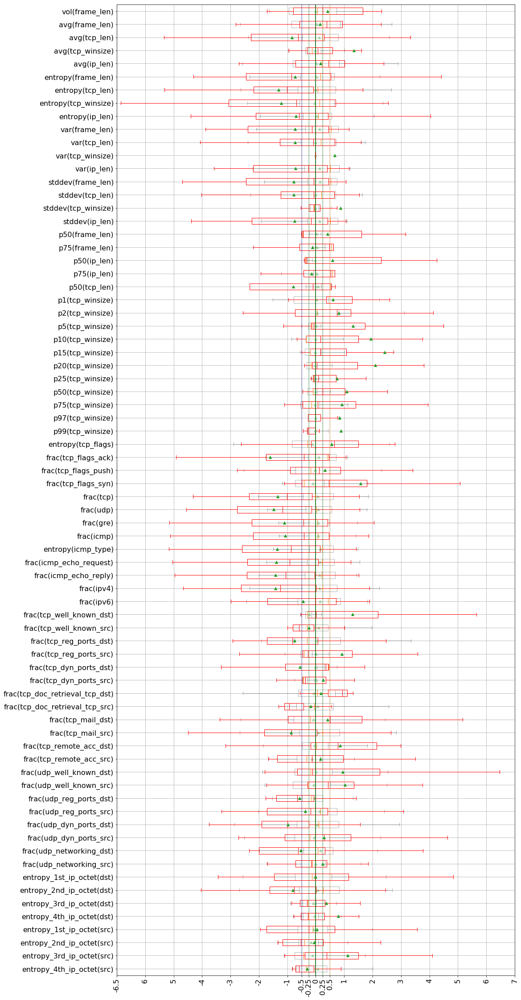

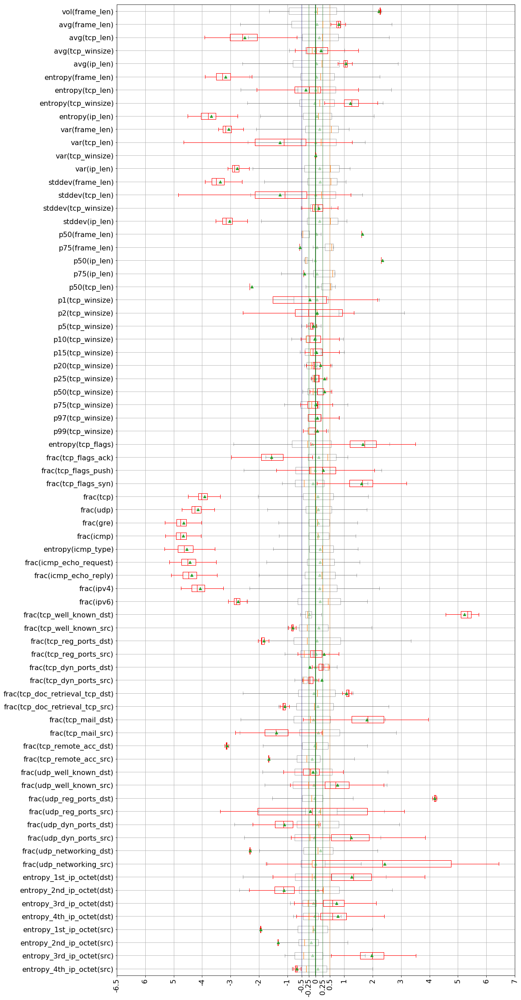

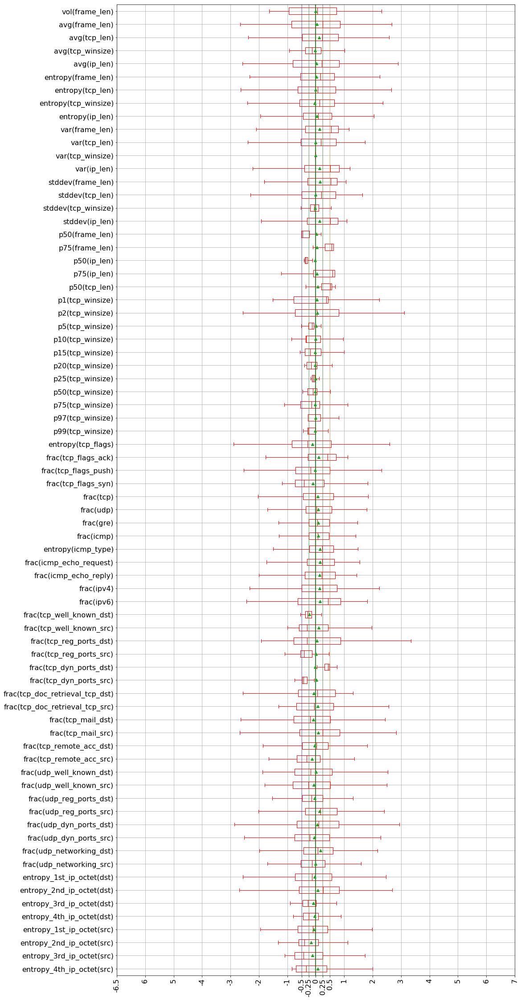

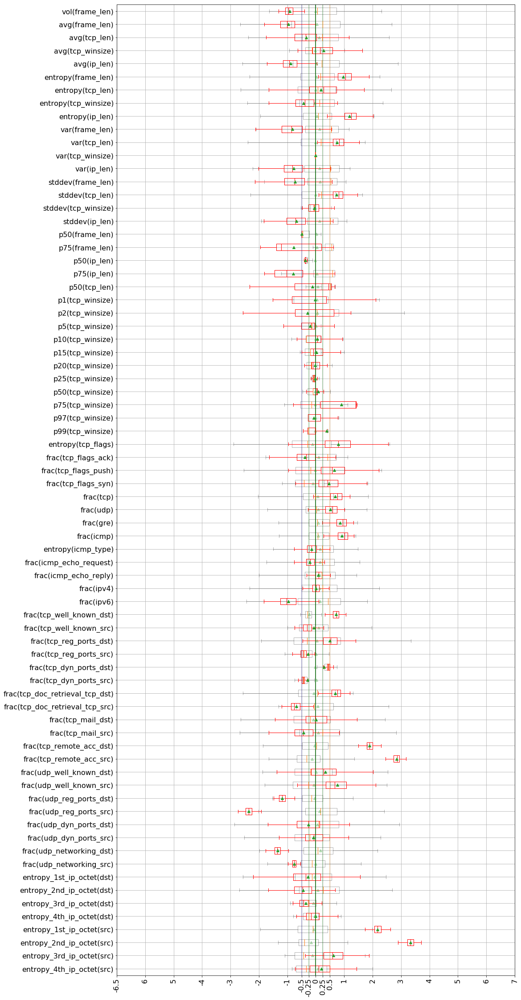

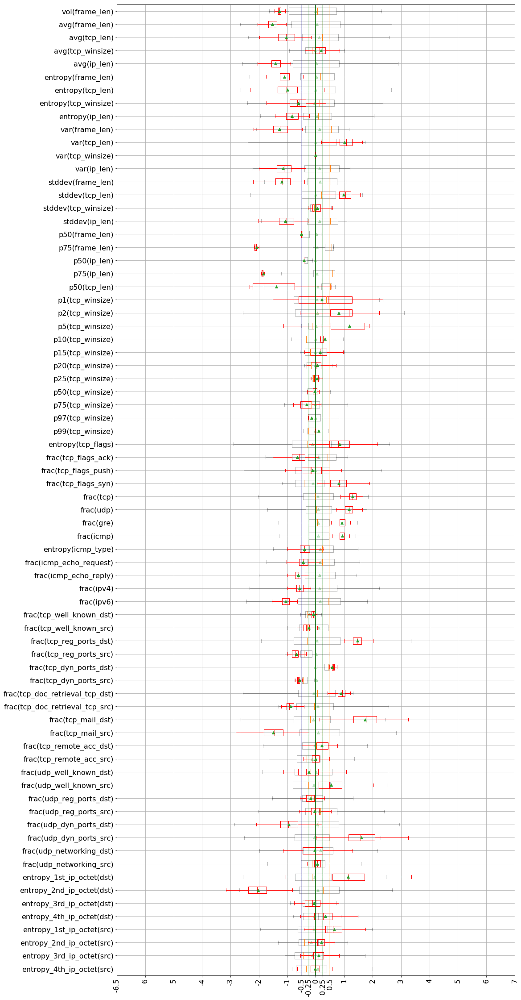

...

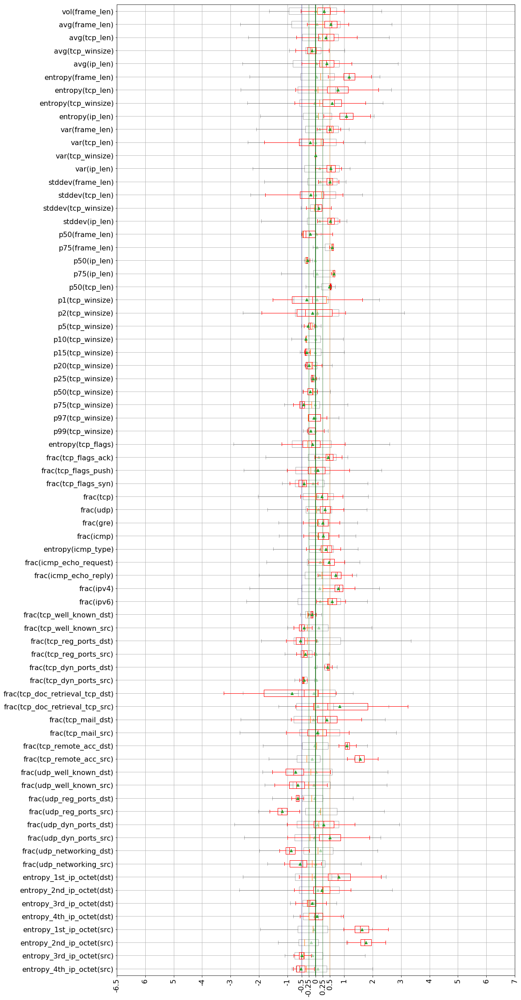

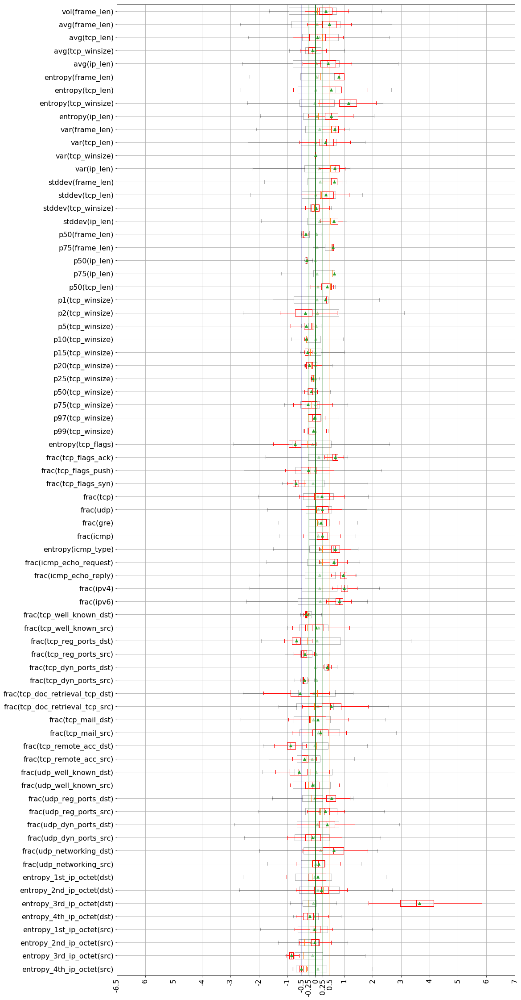

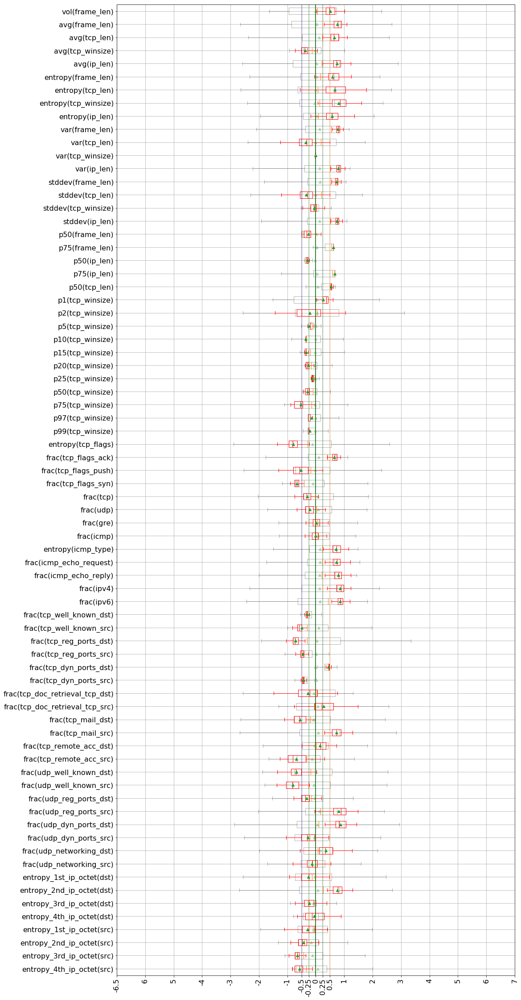

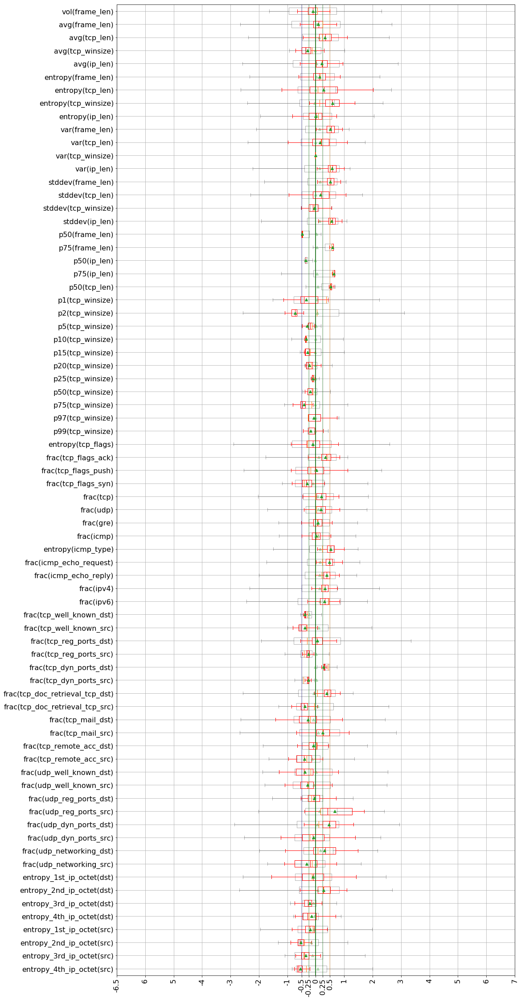

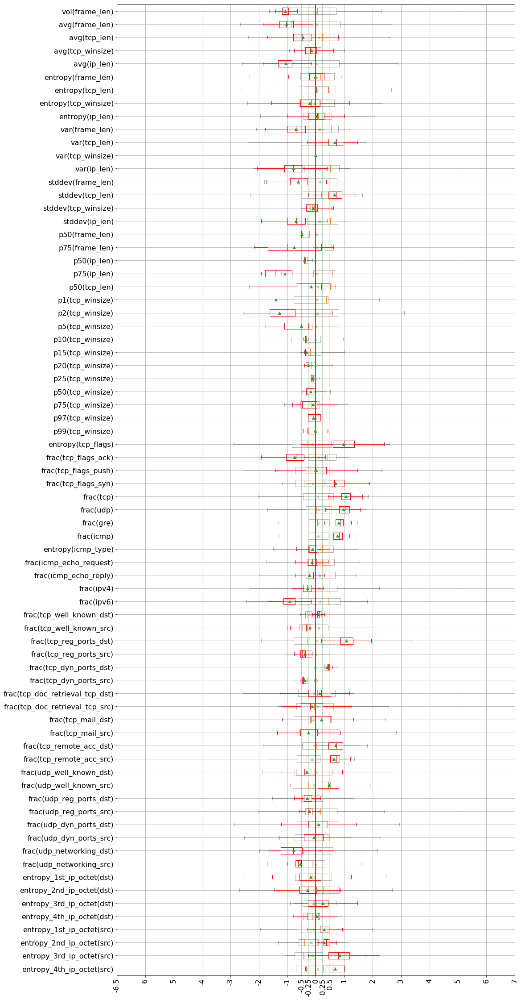

In [15]:
# I used pandas boxplot as its faster, I need less parameters and it puts grid/features names
for i in range(-1,12):
    fig, ax = plt.subplots(1, 1, figsize=(16,40), sharex=True)
    # I use matplotlib boxplot as I couldnt figure out how to make pandas boxplot transparent
    boxplot = ax.boxplot(dataset[dataset['label']==largest_cluster][dataset.columns[:-1]].values, vert=False,showfliers=False,boxprops=dict(alpha=.3),whiskerprops=dict(alpha=.3),capprops=dict(alpha=.3),meanprops=dict(alpha=.3),showmeans=True)
    dataset[dataset['label']==i][dataset.columns[:-1]].plot(fontsize = 16,kind='box',color=dict(boxes='red', whiskers='red', medians='red', caps='red'),vert=False,showfliers=False,ax=ax,grid=True,showmeans=True)
    ax.set_xlim([-7,7])
    ax.set_xticks([-7,-6,-5,-4,-3,-2,-1,-0.5,-0.25,0,0.25,0.5,1,2,3,4,5,6,7])
    ax.set_xticklabels(['-6.5','6','5','-4','-3','-2','-1','-0.5','-0.25','0','0.25','0.5','1','2','3','4','5','6','7'],rotation=90)
    ax.axvline(0.5, color='darkorange',alpha=.3)
    ax.axvline(0.25, color='green',alpha=.3)
    ax.axvline(-0.5, color='darkblue',alpha=.3)
    ax.axvline(-0.25, color='green',alpha=.3)
    ax.axvline(0, color='darkgreen')
    ax.set_yticklabels(reordered_columns_boxplot)    
    fig.savefig('plots/mawi212_xi002_cluster_'+str(i)+'_feature_interpretation.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [55]:
# .T - table is transposed, we see features in rows
# midpoint of background gradient can't be set to fix values, i.e. 1, it wan be only shifted by custome functions in interval [0,1] for whole table
# axis=1 colormap is applied rowise
# 
clusters_interpretation_features[reordered_columns_orig].T.style.background_gradient(cmap='coolwarm',axis=1)

label,-1,0,1,2,3,4,5,6,7,8,9,10,11
vol(frame_len),0.415973,2.21922,0.000194596,-0.922975,-1.2731,-0.46776,0.039268,0.123682,0.295857,0.36013,0.503804,-0.0985115,-1.07062
avg(frame_len),0.152261,0.807976,0.0352222,-0.968943,-1.53087,-0.0325219,0.0403098,0.124193,0.528503,0.479016,0.759804,0.082995,-1.02404
avg(tcp_len),-0.841787,-2.50764,0.111576,-0.341121,-1.04604,0.618831,-0.377968,0.490845,0.358207,0.061895,0.652881,0.327855,-0.442836
avg(tcp_winsize),1.33678,0.17862,-0.0285993,0.269965,0.176143,-0.0867346,0.0731664,-0.114751,-0.133225,-0.119665,-0.364532,-0.296855,-0.142312
avg(ip_len),0.161043,1.05153,0.0237972,-0.881454,-1.41997,-0.0307685,0.0307042,0.192566,0.381316,0.431588,0.743146,0.210088,-1.06363
entropy(frame_len),-0.722015,-3.1789,0.0265982,0.970495,-1.10252,0.474244,0.885971,0.269489,1.17528,0.805161,0.5941,0.127385,-0.0215391
entropy(tcp_len),-1.31292,-0.350979,-0.00593817,0.180864,-1.00128,-0.207115,0.14378,0.994497,0.774688,0.542739,0.667411,0.282547,0.0051333
entropy(tcp_winsize),-1.22016,1.2123,-0.0330932,-0.432176,-0.620994,-0.863084,0.661926,0.638215,0.567904,1.14522,0.804147,0.583259,-0.219065
entropy(ip_len),-0.695624,-3.6748,0.0361953,1.18872,-0.84239,0.735873,0.703907,0.269721,1.07936,0.536785,0.564966,-0.0116772,0.0218402
var(frame_len),-0.735952,-3.06165,0.139662,-0.81529,-1.2771,0.293853,0.419849,0.506695,0.489926,0.67361,0.780182,0.51347,-0.704837


## Section 3.6. OPTICS Interpretation by MAWIlab anomaly magnitudes

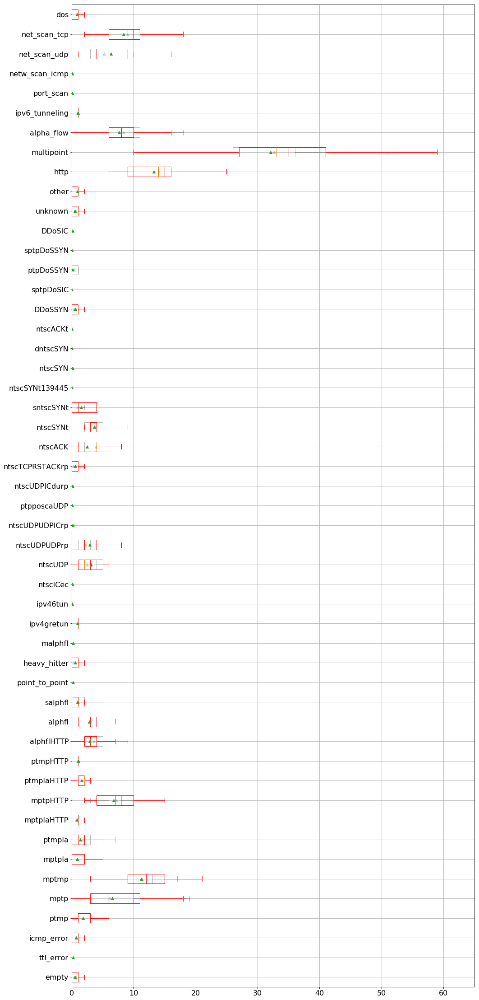

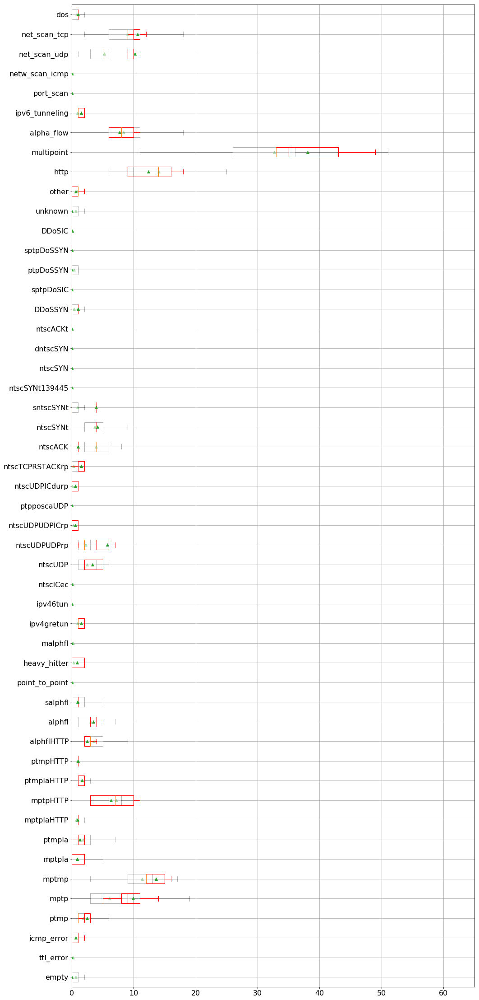

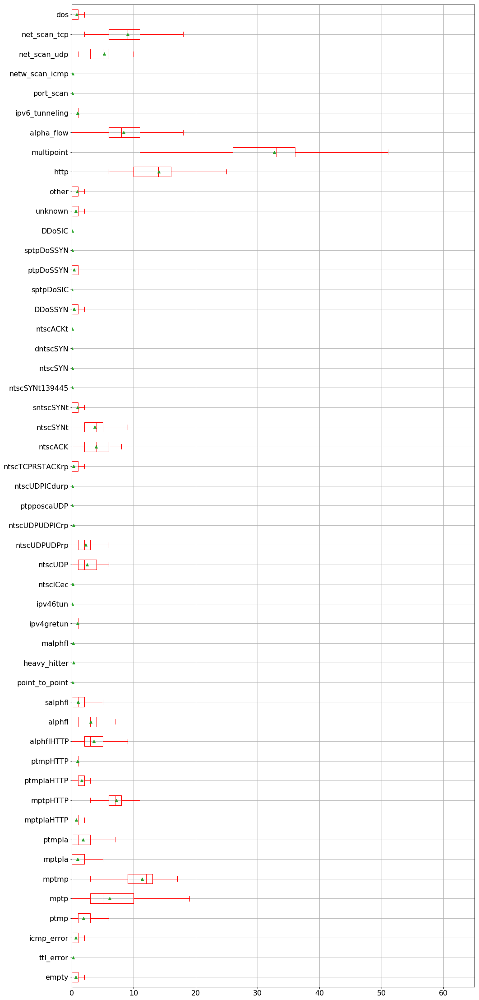

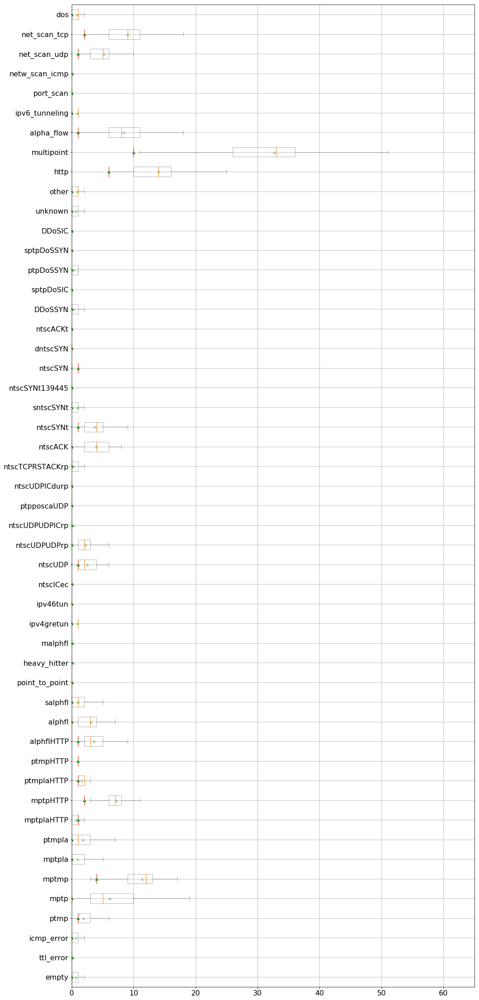

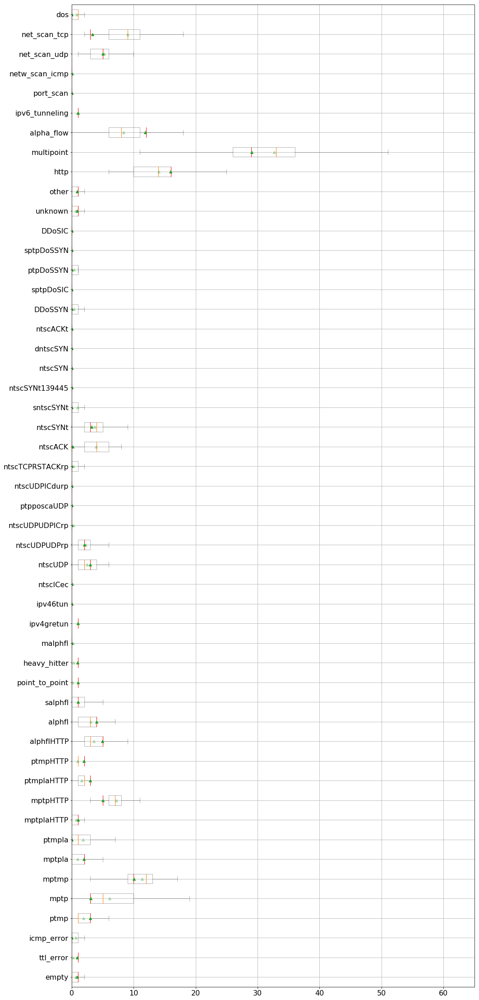

...

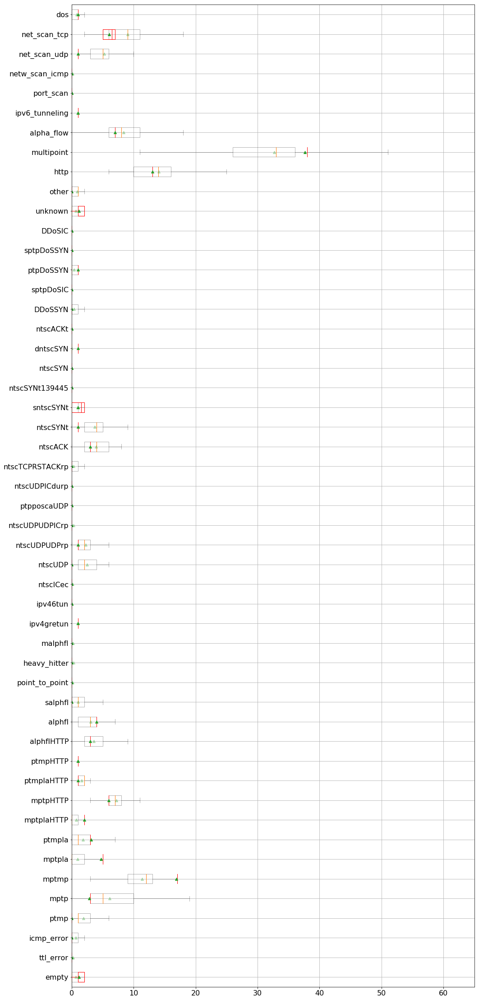

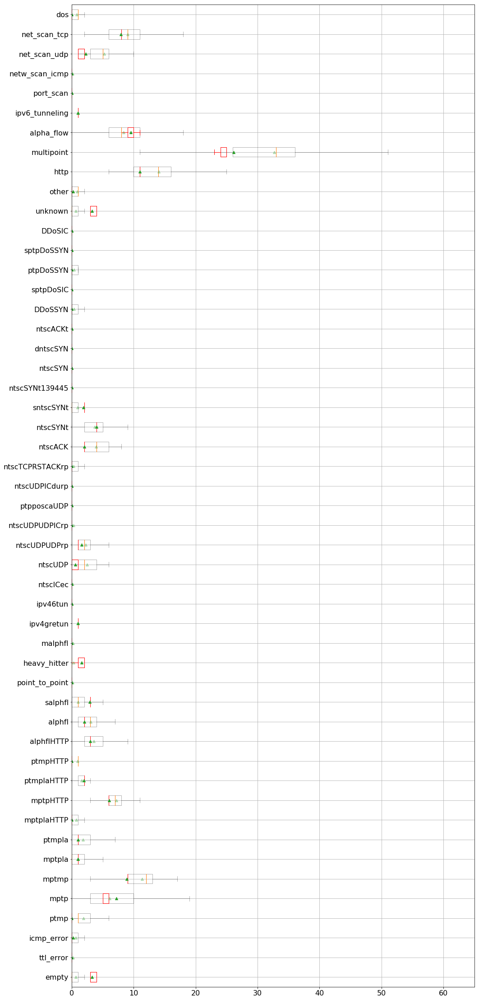

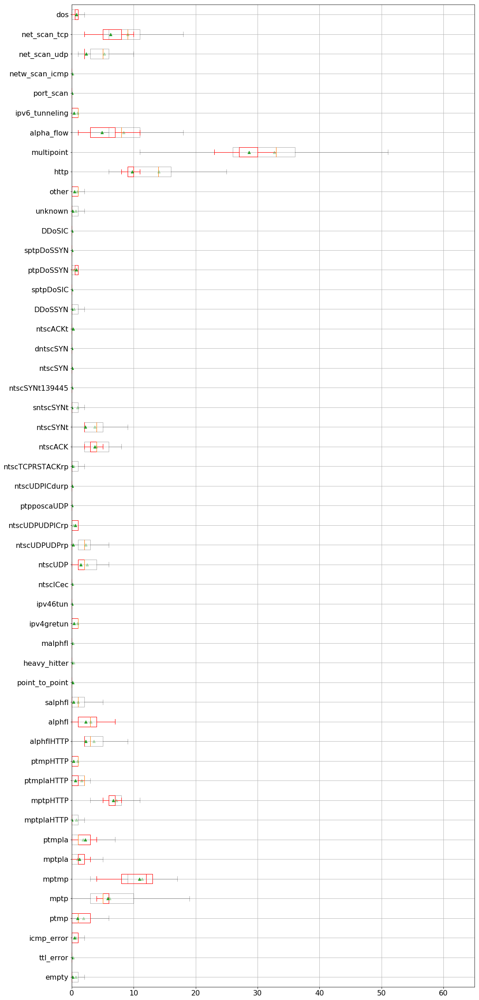

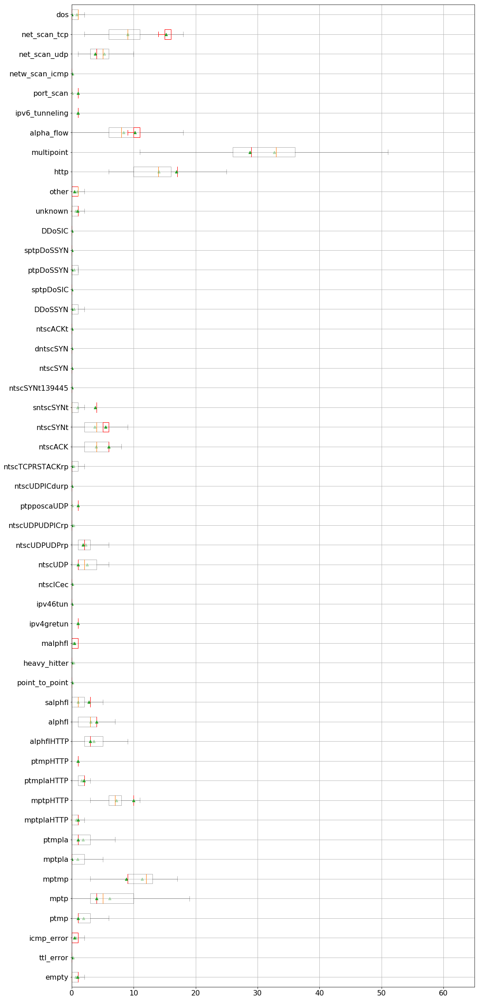

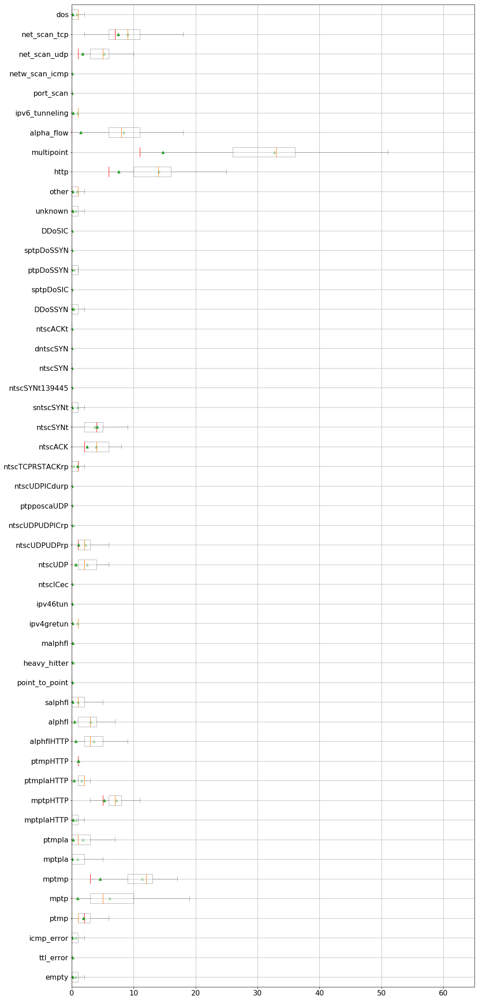

In [16]:
# there is no 'port_scan' major label in a give dataset, so I am filtering it out from boxplot
#major_labels = ['unknown', 'other', 'http', 'multipoint', 'alpha_flow','ipv6_tunneling', 'netw_scan_icmp', 'net_scan_udp','net_scan_tcp', 'dos']
for i in range(-1,12):
    fig, ax = plt.subplots(1, 1, figsize=(16,40) , sharex=True)
    boxplot = ax.boxplot(ground_truth_pd_filtered[ground_truth_pd_filtered['label']==largest_cluster][ground_truth_pd_filtered.columns[:-2]].values, vert=False,showfliers=False,boxprops=dict(alpha=.3),whiskerprops=dict(alpha=.3),capprops=dict(alpha=.3),meanprops=dict(alpha=.3),showmeans=True)
    ground_truth_pd_filtered[ground_truth_pd_filtered['label']==i][ground_truth_pd_filtered.columns[:-2]].plot(fontsize = 16, kind='box',color=dict(boxes='red', whiskers='red', medians='red', caps='red'),vert=False,showfliers=False,ax=ax,grid=True,showmeans=True)
    ax.set_xlim([0,65])
    fig.savefig('plots/mawi212_xi002_cluster_'+str(i)+'_anomaly_interpretation.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [58]:
clusters_interpretation_anomalies_norm[clusters_interpretation_anomalies_norm.columns[::-1]].T.style.background_gradient(cmap='coolwarm',axis=1)#.apply()

label,-1,0,1,2,3,4,5,6,7,8,9,10,11
dos,1.13181,1.34508,1,0,0.00506768,3.26142,0,0.29554,1.2635,0.00367371,0.959219,0.00306728,0.17872
net_scan_tcp,0.925735,1.1746,1,0.2212,0.372893,1.13416,0.2212,0.887425,0.664289,0.873392,0.688178,1.68281,0.832517
net_scan_udp,1.21603,1.95533,1,0.192075,0.957339,1.2569,0.19713,0.632871,0.192075,0.430931,0.451021,0.728323,0.333221
netw_scan_icmp,0.407099,0,1,0,0,7.69948,0,0.365399,0,0,0,0,0
port_scan,0.650516,0,1,0,0,0,0,0,0,0,0,11.2919,0.0342999
ipv6_tunneling,1.02852,1.60349,1,0,1.03566,1.03566,0,0.902251,1.03566,1.03269,0.375905,1.03566,0.221254
alpha_flow,0.916852,0.927376,1,0.119769,1.42303,1.46487,0.193837,0.901718,0.838382,1.13901,0.587311,1.21918,0.176024
multipoint,0.982219,1.1644,1,0.305735,0.888929,0.854356,0.397456,0.884767,1.15088,0.799292,0.875082,0.878441,0.448504
http,0.940514,0.878788,1,0.426763,1.13522,1.00786,0.613004,0.742134,0.924654,0.783011,0.694939,1.20355,0.535825
other,1.09401,0.732263,1,0,1.05074,3.82474,0,0.663787,0,0.244835,0.536245,0.556476,0.204988


# Section 4. HDBSCAN

## Section 4.1. Computation by hdbscan library in python
https://github.com/scikit-learn-contrib/hdbscan
https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html

In [3]:
labels_list = list()
cluster_hierarchy_list = list()
probabilities_list = list()
persistence_list = list()
outlier_scores_list = list()
relative_validity_list = list()
minimum_spanning_tree_list = list()
condensed_tree_list = list()
minpts_list = [107,212]

for minpts in minpts_list:
    # hdbscan.robust_single_linkage_.RobustSingleLinkage(cut=0.4, k=5, gamma=5)
    # gamma: Ignore any clusters in the flat clustering with size less than gamma, and declare points in such clusters as noise points.
    # k : Reachability distances will be computed with regard to the k nearest neighbors.
    # cut : The reachability distance value to cut the cluster heirarchy at to derive a flat cluster labelling.
    #
    # cluster_selection_method = ['eom','leaf']
    # allow_single_cluster=True
    hdbscan_clust = hdbscan.HDBSCAN(min_samples=minpts,min_cluster_size=10,cluster_selection_method='eom',approx_min_span_tree=False,gen_min_span_tree=True)
    hdbscan_clust.fit(mawi_features_052016_pd_standard_scaled_106.values)
    #
    labels_list.append(hdbscan_clust.labels_)
    #cluster_hierarchy_list.append(hdbscan_clust.single_linkage_tree_
    probabilities_list.append(hdbscan_clust.probabilities_)
    persistence_list.append(hdbscan_clust.cluster_persistence_)
    outlier_scores_list.append(hdbscan_clust.outlier_scores_)
    #relative_validity_list.append(hdbscan_clust.relative_validity_)
    #minimum_spanning_tree_list.append(hdbscan_clust.minimum_spanning_tree_)
    condensed_tree_list.append(hdbscan_clust.condensed_tree_)

/home/big-dama/anaconda3/lib/python3.7/site-packages/hdbscan/hdbscan_.py:217: UserWarning: Cannot generate Minimum Spanning Tree; the implemented Prim's does not produce the full minimum spanning tree 
  'the full minimum spanning tree ', UserWarning)
/home/big-dama/anaconda3/lib/python3.7/site-packages/hdbscan/hdbscan_.py:217: UserWarning: Cannot generate Minimum Spanning Tree; the implemented Prim's does not produce the full minimum spanning tree 
  'the full minimum spanning tree ', UserWarning)


In [5]:
# create structured pandas
mawi_hdbscan_results = {'minpts' : minpts_list,
                       'persistence' : persistence_list,
                       'probabilities' : probabilities_list,
                       'outlier_scores' : outlier_scores_list,
                       'labels' : labels_list,
                       #'relative_validity' : relative_validity_list,
                       #'minimum_spanning_tree' : minimum_spanning_tree_list,
                       'condensed_tree' : condensed_tree_list}
                       #'cluster_hierarchy' : cluster_hierarchy_list}
mawi_hdbscan_results_df = pd.DataFrame(mawi_hdbscan_results)

In [8]:
# save/load results
#mawi_hdbscan_results_df.to_pickle('results/mawi_hdbscan_eom_results_df.csv')
mawi_hdbscan_results_df = pd.read_pickle('results/mawi_hdbscan_eom_results_df.csv')

In [7]:
mawi_hdbscan_results_df.rename(columns={'labels':'clusters_labels'},inplace=True)
noise_index_list= list()
for labels in mawi_hdbscan_results_df['clusters_labels']:
    noise_index_list.append(np.where(labels==-1)[0])
mawi_hdbscan_results_df['noise_index'] = noise_index_list

In [17]:
#mawi_hdbscan_results_df.to_pickle('mawi_hdbscan_eom_results_df.csv')
mawi_hdbscan_results_df = pd.read_pickle('mawi_hdbscan_eom_results_df.csv')

## Section 4.2. HDBSCAN results visualization by condensed trees

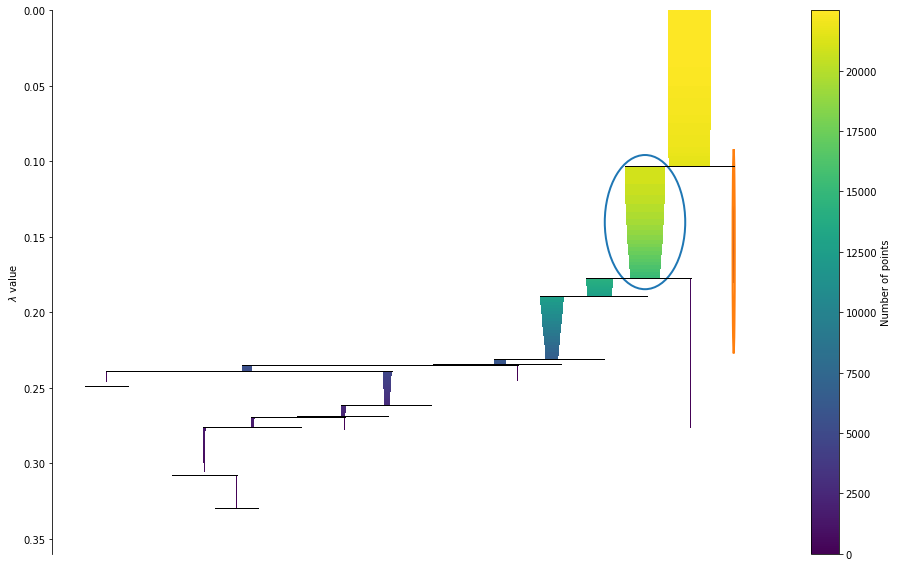

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(16,10))
mawi_hdbscan_results_df['condensed_tree'][0].plot(select_clusters=True, selection_palette=sns.color_palette(),axis=ax,colorbar=True)
cbar_ax = fig.axes[-1]
matplotlib.rcParams.update({'font.size': 24})
#fig.savefig('plots/mawi_hdbscan_condensed_tree_minpts107_mincl10.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

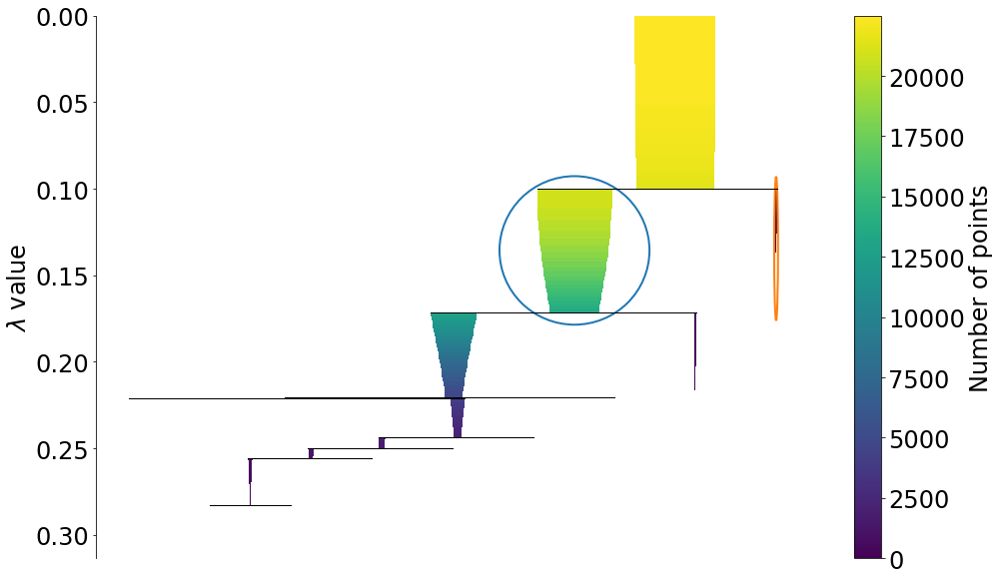

In [19]:
fig, ax = plt.subplots(1, 1, figsize=(16,10))
mawi_hdbscan_results_df['condensed_tree'][1].plot(select_clusters=True, selection_palette=sns.color_palette(),axis=ax,colorbar=True)
cbar_ax = fig.axes[-1]
matplotlib.rcParams.update({'font.size': 24})
#fig.savefig('plots/mawi_hdbscan_condensed_tree_minpts212_mincl10.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

## Section 4.3. HDBSCAN clusters continuity + sizes

In [33]:
unique_clusters, counts = np.unique(mawi_hdbscan_results_df['clusters_labels'][mawi_hdbscan_results_df['minpts']==212].values[0],return_counts=True)
counts = counts/float(len(mawi_features_052016_pd_standard_scaled_106))

print('Cluster counts HDBSCAN, minpts=212, MinCl=10 :')
for label,count in zip(unique_clusters,counts):
    print('Cluster ' + str(label) + ' size : ' + str(count))

Cluster counts HDBSCAN, minpts=212, MinCl=10 :
Cluster -1 size : 0.0495621638440681
Cluster 0 size : 0.926923589811975
Cluster 1 size : 0.023514246343956973


Cluster min/max -1: 0.0011111111111111111/0.04555555555555556
4.555555555555555
Cluster min/max 0: 0.0011111111111111111/0.6455555555555555
64.55555555555556
Cluster min/max 1: 0.0011111111111111111/0.01888888888888889
1.8888888888888888


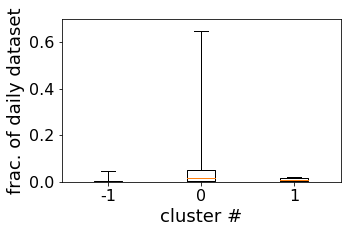

In [36]:
dataset = mawi_hdbscan_results_df['clusters_labels'][mawi_hdbscan_results_df['minpts']==212].values[0].copy()
continuity_boxplot_list = list()
for uq_cl in unique_clusters:
    continuity_boxplot_temp = list()
    temp = 0
    for i in range(len(dataset)):
        # reset counter after every 900 samples
        if ((i>0) and (float(i//900) == (i/900))):
            if temp>0:
                continuity_boxplot_temp.append(temp/900)
            temp = 0
        if dataset[i]==uq_cl:
            temp+=1
        if dataset[i]!=uq_cl and temp>0:
            continuity_boxplot_temp.append(temp/900)
            temp = 0
    continuity_boxplot_list.append(continuity_boxplot_temp)

fig, ax = plt.subplots(1, 1, figsize=(5, 3))

boxplot_data = continuity_boxplot_list
ax.boxplot(boxplot_data, whis='range',showfliers=True)
#ax.set_ylim(0,0.1)
ax.set_xticklabels(unique_clusters)
#ax.set_xlim(0.5,len(unique_clusters)+0.5)
ax.set_ylabel('frac. of daily dataset')
ax.set_xlabel('cluster #')
#ax.set_title('MAWI OPTICS cluster continuity')
for i,cl in zip(boxplot_data,unique_clusters):
    print('Cluster min/max ' +str(cl)+ ': ' +str(min(i))+ '/' +str(max(i)))
    print(str(max(i)*100))
ax.set_ylim([0,0.7])
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.tick_params(labelsize=16)
fig.savefig('plots/mawi_hdbscan_clusters_continuity_minpts212_mincl10.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [8]:
dataset = mawi_features_052016_pd_standard_scaled_106.copy()
dataset['label'] = mawi_hdbscan_results_df['clusters_labels'][mawi_hdbscan_results_df['minpts']==212].values[0].copy()

labels = dataset['label']
clusters_index = np.where(labels!=-1)[0]
clusters_labels = labels[clusters_index] 

hom,comp,vm = metrics.homogeneity_completeness_v_measure(ground_truth_pd_binary_filtered['major_category_decimal_cluster_label_relabeled'][clusters_index], clusters_labels)
print('HDBSCAN V-measure is ' + str(vm))

HDBSCAN V-measure is 0.027682480214902872


## Section 4.4 HDBSCAN interpretation by feature values

In [20]:
reordered_columns_orig = ['vol(frame_len)', 'avg(frame_len)', 'avg(tcp_len)', 'avg(tcp_winsize)', 'avg(ip_len)', 'entropy(frame_len)', 'entropy(tcp_len)', 'entropy(tcp_winsize)','entropy(ip_len)','var(frame_len)', 'var(tcp_len)', 'var(tcp_winsize)', 'var(ip_len)','stddev(frame_len)', 'stddev(tcp_len)','stddev(tcp_winsize)', 'stddev(ip_len)', 'p50(frame_len)', 'p75(frame_len)', 'p50(ip_len)', 'p75(ip_len)','p50(tcp_len)','p1(tcp_winsize)','p2(tcp_winsize)','p5(tcp_winsize)','p10(tcp_winsize)', 'p15(tcp_winsize)', 'p20(tcp_winsize)', 'p25(tcp_winsize)', 'p50(tcp_winsize)', 'p75(tcp_winsize)', 'p97(tcp_winsize)', 'p99(tcp_winsize)','entropy(tcp_flags)', 'frac_tcpflag(tcp_flags_ack)','frac_tcpflag(tcp_flags_push)', 'frac_tcpflag(tcp_flags_syn)','entropy_1st_ip_octet(ip_dst)','entropy_2nd_ip_octet(ip_dst)', 'entropy_3rd_ip_octet(ip_dst)', 'entropy_4th_ip_octet(ip_dst)','entropy_1st_ip_octet(ip_src)', 'entropy_2nd_ip_octet(ip_src)','entropy_3rd_ip_octet(ip_src)','entropy_4th_ip_octet(ip_src)','frac_tcp(ip_proto)','frac_udp(ip_proto)', 'frac_gre(ip_proto)','frac_icmp(ip_proto)','entropy(icmp_type)','frac_echo_request(icmp_type)', 'frac_echo_reply(icmp_type)', 'frac_ipv4', 'frac_ipv6','frac_well_known(tcp_dstport)','frac_well_known(tcp_srcport)', 'frac_well_known(udp_dstport)','frac_well_known(udp_srcport)','frac_registered_ports(tcp_dstport)','frac_registered_ports(tcp_srcport)','frac_registered_ports(udp_dstport)','frac_registered_ports(udp_srcport)','frac_dynamic_ports(tcp_dstport)','frac_dynamic_ports(tcp_srcport)','frac_dynamic_ports(udp_dstport)','frac_dynamic_ports(udp_srcport)', 'frac_document_retrieval_tcp(tcp_dstport)','frac_document_retrieval_tcp(tcp_srcport)','frac_mail_tcp(tcp_dstport)', 'frac_mail_tcp(tcp_srcport)','frac_networking_udp(udp_dstport)','frac_networking_udp(udp_srcport)','frac_remote_access_tcp(tcp_dstport)','frac_remote_access_tcp(tcp_srcport)']
reordered_columns_orig_boxplot = ['vol(frame_len)','avg(frame_len)','avg(tcp_len)','avg(tcp_winsize)','avg(ip_len)','entropy(frame_len)','entropy(tcp_len)','entropy(tcp_winsize)','entropy(ip_len)','var(frame_len)','var(tcp_len)','var(tcp_winsize)','var(ip_len)','stddev(frame_len)','stddev(tcp_len)','stddev(tcp_winsize)','stddev(ip_len)','p50(frame_len)','p75(frame_len)','p50(ip_len)','p75(ip_len)','p50(tcp_len)','p1(tcp_winsize)','p2(tcp_winsize)','p5(tcp_winsize)','p10(tcp_winsize)','p15(tcp_winsize)','p20(tcp_winsize)','p25(tcp_winsize)','p50(tcp_winsize)','p75(tcp_winsize)','p97(tcp_winsize)','p99(tcp_winsize)','entropy(tcp_flags)','frac(tcp_flags_ack)','frac(tcp_flags_push)','frac(tcp_flags_syn)','frac(tcp)','frac(udp)','frac(gre)','frac(icmp)','entropy(icmp_type)','frac(icmp_echo_request)','frac(icmp_echo_reply)','frac(ipv4)','frac(ipv6)','frac(tcp_well_known_dst)','frac(tcp_well_known_src)','frac(tcp_reg_ports_dst)','frac(tcp_reg_ports_src)','frac(tcp_dyn_ports_dst)','frac(tcp_dyn_ports_src)','frac(tcp_doc_retrieval_tcp_dst)','frac(tcp_doc_retrieval_tcp_src)','frac(tcp_mail_dst)','frac(tcp_mail_src)','frac(tcp_remote_acc_dst)','frac(tcp_remote_acc_src)','frac(udp_well_known_dst)','frac(udp_well_known_src)','frac(udp_reg_ports_dst)','frac(udp_reg_ports_src)','frac(udp_dyn_ports_dst)','frac(udp_dyn_ports_src)','frac(udp_networking_dst)','frac(udp_networking_src)','entropy_1st_ip_octet(dst)','entropy_2nd_ip_octet(dst)','entropy_3rd_ip_octet(dst)','entropy_4th_ip_octet(dst)','entropy_1st_ip_octet(src)','entropy_2nd_ip_octet(src)','entropy_3rd_ip_octet(src)','entropy_4th_ip_octet(src)']
reordered_columns_boxplot = reordered_columns_orig_boxplot[::-1]
# reverse the list for boxplots
reordered_columns = reordered_columns_orig[::-1]

# define features and groudn truth datasets we will use
dataset = mawi_features_052016_pd_standard_scaled_106[reordered_columns].copy()
dataset['label'] = mawi_hdbscan_results_df['clusters_labels'][mawi_hdbscan_results_df['minpts']==212].values[0].copy()

# I guess there is some issue in scikit optics implemenation as for xi values <0.05 it outputs only labels [0,-1] - 
# -1 should be noise, but at the sametim eit creates hierarchy that is simialr to ELKI results(no noise flag)
# we need to label dataset ourselves - we start from the end


# add cluster labels also to ground truth dataset
ground_truth_pd_filtered['label'] = dataset['label'].values.copy()

# "normal" - largest cluster
largest_cluster = dataset['label'].value_counts()[:1].index[0]    

# mean feature values for each cluster
clusters_interpretation_features = dataset.groupby('label').mean()

#subtract largest cluster features average values from cluster feaures
largest_cluster_features = clusters_interpretation_features.loc[largest_cluster]
clusters_interpretation_features_norm = clusters_interpretation_features.copy()
for index in clusters_interpretation_features.index.values:
    clusters_interpretation_features_norm.loc[index] = clusters_interpretation_features.loc[index].sub(largest_cluster_features)

# clusters interpretation through anomalies detected by MAWILab    
clusters_interpretation_anomalies = ground_truth_pd_filtered.groupby('label').mean()

#normalize cluster anomaly average values according to largest cluster
largest_cluster_anomalies = clusters_interpretation_anomalies.loc[largest_cluster]
clusters_interpretation_anomalies_norm = clusters_interpretation_anomalies.copy()
for index in clusters_interpretation_anomalies.index.values:
    clusters_interpretation_anomalies_norm.loc[index] = clusters_interpretation_anomalies.loc[index].div(largest_cluster_anomalies)

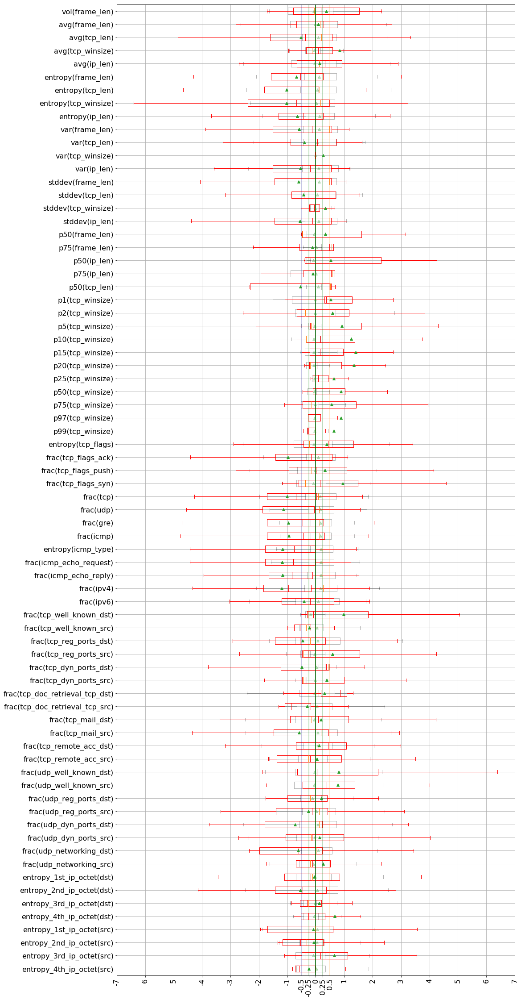

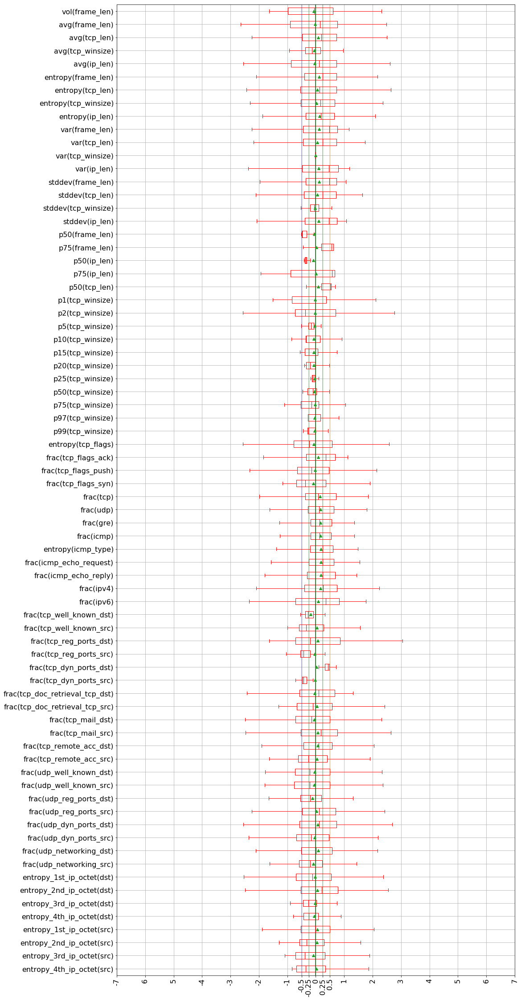

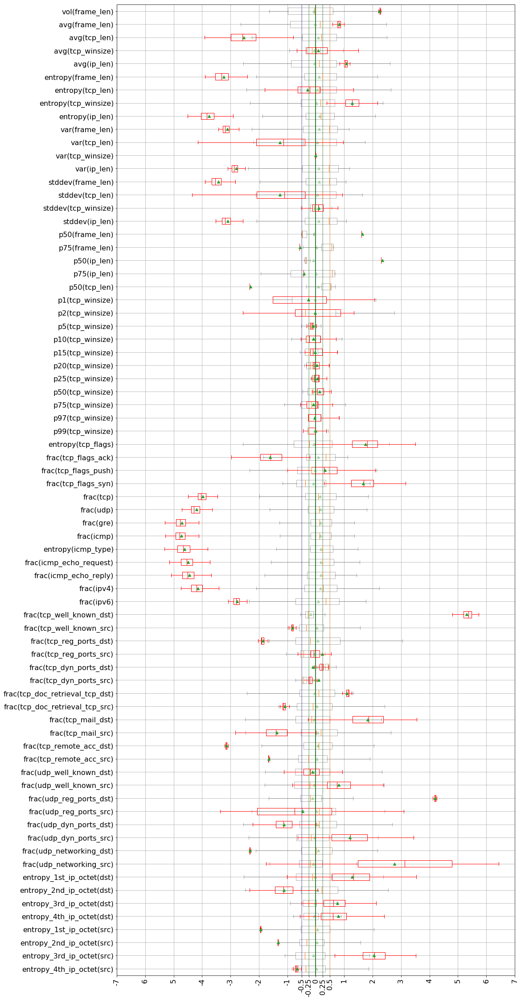

In [21]:
# I used pandas boxplot as its faster, I need less parameters and it puts grid/features names
for i in range(-1,2):
    fig, ax = plt.subplots(1, 1, figsize=(16,40), sharex=True)
    # I use matplotlib boxplot as I couldnt figure out how to make pandas boxplot transparent
    boxplot = ax.boxplot(dataset[dataset['label']==largest_cluster][dataset.columns[:-1]].values, vert=False,showfliers=False,boxprops=dict(alpha=.3),whiskerprops=dict(alpha=.3),capprops=dict(alpha=.3),meanprops=dict(alpha=.3),showmeans=True)
    dataset[dataset['label']==i][dataset.columns[:-1]].plot(fontsize = 16,kind='box',color=dict(boxes='red', whiskers='red', medians='red', caps='red'),vert=False,showfliers=False,ax=ax,grid=True,showmeans=True)
    ax.set_xlim([-7,7])
    ax.set_xticks([-7,-6,-5,-4,-3,-2,-1,-0.5,-0.25,0,0.25,0.5,1,2,3,4,5,6,7])
    ax.set_xticklabels(['-7','6','5','-4','-3','-2','-1','-0.5','-0.25','0','0.25','0.5','1','2','3','4','5','6','7'],rotation=90)
    ax.axvline(0.5, color='darkorange',alpha=.3)
    ax.axvline(0.25, color='green',alpha=.3)
    ax.axvline(-0.5, color='darkblue',alpha=.3)
    ax.axvline(-0.25, color='green',alpha=.3)
    ax.axvline(0, color='darkgreen')
    ax.set_yticklabels(reordered_columns_boxplot)    
    fig.savefig('plots/mawi106_hdbscan212_mincl10_cluster_'+str(i)+'_feature_interpretation.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [46]:
# .T - table is transposed, we see features in rows
# midpoint of background gradient can't be set to fix values, i.e. 1, it wan be only shifted by custome functions in interval [0,1] for whole table
# axis=1 colormap is applied rowise
# 
clusters_interpretation_features[reordered_columns_orig].T.style.background_gradient(cmap='coolwarm',axis=1)

label,-1,0,1
vol(frame_len),0.374894,-0.0768508,2.23925
avg(frame_len),0.0829236,-0.025438,0.827976
avg(tcp_len),-0.524611,0.0923032,-2.53281
avg(tcp_winsize),0.837331,-0.0470675,0.0904976
avg(ip_len),0.133087,-0.0343234,1.0725
entropy(frame_len),-0.680115,0.118678,-3.24474
entropy(tcp_len),-1.02725,0.0621601,-0.285148
entropy(tcp_winsize),-1.02112,0.0220058,1.2848
entropy(ip_len),-0.647313,0.129813,-3.75282
var(frame_len),-0.587985,0.110273,-3.1076


## Section 4.5. HDBSCAN Interpretation by MAWIlab anomaly magnitudes

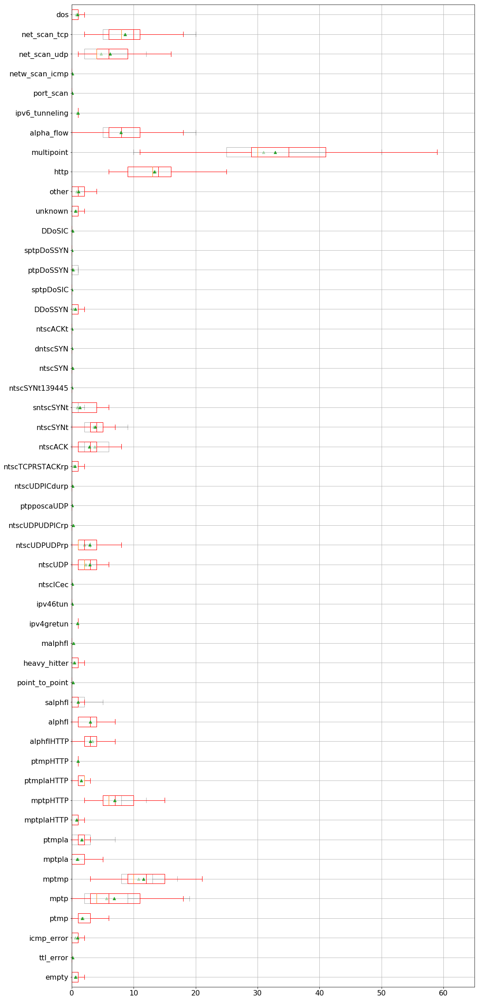

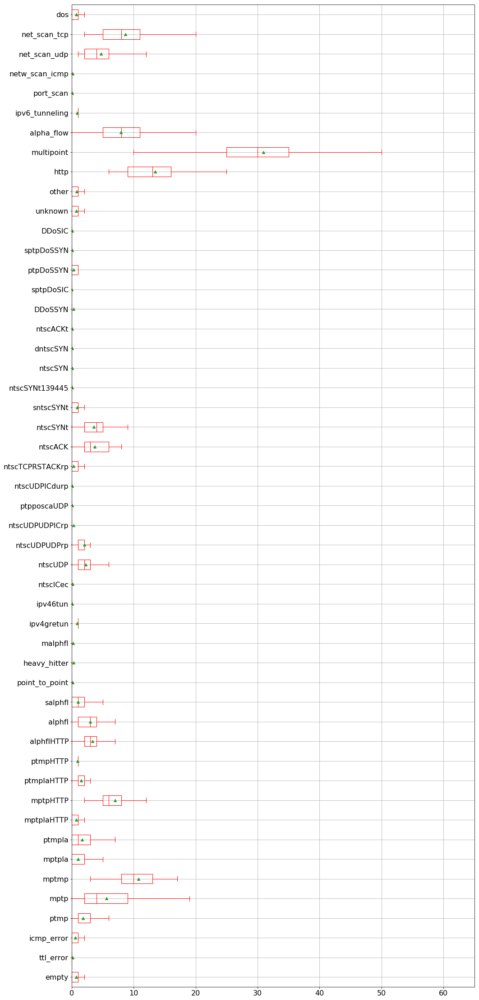

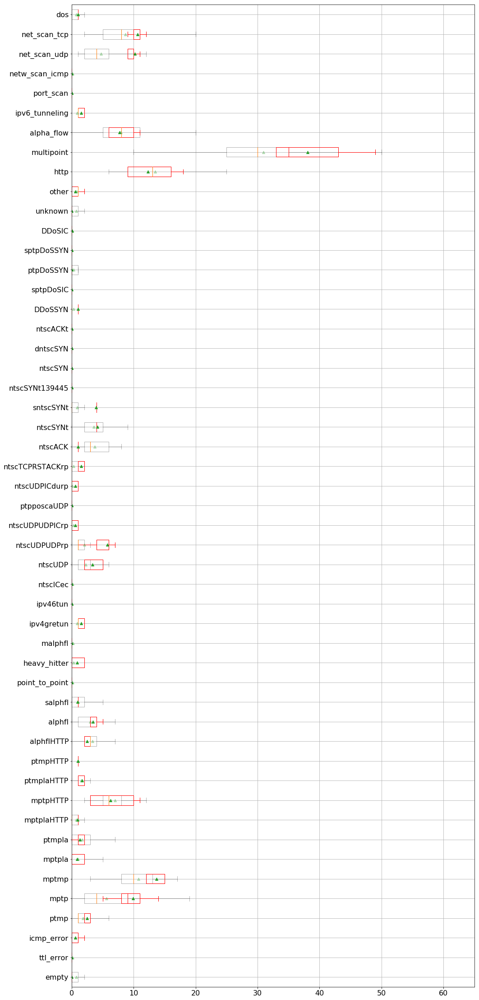

In [22]:
# there is no 'port_scan' major label in a give dataset, so I am filtering it out from boxplot
#major_labels = ['unknown', 'other', 'http', 'multipoint', 'alpha_flow','ipv6_tunneling', 'netw_scan_icmp', 'net_scan_udp','net_scan_tcp', 'dos']
for i in range(-1,2):
    fig, ax = plt.subplots(1, 1, figsize=(16,40) , sharex=True)
    boxplot = ax.boxplot(ground_truth_pd_filtered[ground_truth_pd_filtered['label']==largest_cluster][ground_truth_pd_filtered.columns[:-2]].values, vert=False,showfliers=False,boxprops=dict(alpha=.3),whiskerprops=dict(alpha=.3),capprops=dict(alpha=.3),meanprops=dict(alpha=.3),showmeans=True)
    ground_truth_pd_filtered[ground_truth_pd_filtered['label']==i][ground_truth_pd_filtered.columns[:-2]].plot(fontsize = 16, kind='box',color=dict(boxes='red', whiskers='red', medians='red', caps='red'),vert=False,showfliers=False,ax=ax,grid=True,showmeans=True)
    ax.set_xlim([0,65])
    fig.savefig('plots/mawi106_hdbscan212_mincl10_cluster_'+str(i)+'_anomaly_interpretation.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [49]:
clusters_interpretation_anomalies_norm[clusters_interpretation_anomalies_norm.columns[::-1]].T.style.background_gradient(cmap='coolwarm',axis=1)#.apply()

label,-1,0,1
dos,1.27161,1,1.46989
net_scan_tcp,0.992422,1,1.22671
net_scan_udp,1.32,1,2.16395
netw_scan_icmp,0.816913,1,0
port_scan,0.698786,1,0
ipv6_tunneling,1.10506,1,1.72221
alpha_flow,1.00154,1,0.973187
multipoint,1.06239,1,1.23057
http,0.986157,1,0.91382
other,1.40473,1,0.787269


# Section 5. BONUS - Algorithms Outliers Jaccard similarity

In [72]:
#len(mawi_hdbscan_results_df['noise_index'][mawi_hdbscan_results_df['minpts']==212].values[0])
unique_clusters, unique_clusters_counts = np.unique(optics_dataset['label'].values, return_counts=True)

In [74]:
unique_clusters_counts

array([  435,   611, 17601,   729,   253,   377,   152,   295,   482,
         349,   135,   418,   660])

In [75]:
optics_dataset[optics_dataset['label']==-1]

,frac_remote_access_tcp(tcp_srcport),frac_remote_access_tcp(tcp_dstport),frac_networking_udp(udp_srcport),frac_networking_udp(udp_dstport),frac_mail_tcp(tcp_srcport),frac_mail_tcp(tcp_dstport),frac_document_retrieval_tcp(tcp_srcport),frac_document_retrieval_tcp(tcp_dstport),frac_dynamic_ports(udp_srcport),frac_dynamic_ports(udp_dstport),...,entropy(ip_len),entropy(tcp_winsize),entropy(tcp_len),entropy(frame_len),avg(ip_len),avg(tcp_winsize),avg(tcp_len),avg(frame_len),vol(frame_len),label
268,-0.041142,-0.899091,0.014372,0.959303,-0.078593,-0.263383,0.433674,0.873886,-0.624975,-0.145432,...,0.061573,-3.526542,-0.627873,0.307284,0.881214,0.424308,0.027245,0.770617,1.071859,-1
495,-0.414500,-0.650499,-0.277519,0.715635,-0.543313,-0.159797,1.685031,-1.733819,-0.754063,0.094684,...,-0.247958,-4.039024,-1.405385,0.054390,-1.774303,-0.724805,1.687153,1.716853,1.157683,-1
496,-0.511084,-0.655852,-0.233220,0.459977,-0.544396,-0.285580,2.029835,-2.222328,-0.572738,0.211225,...,-0.116053,-4.614550,-2.032355,-0.282557,-1.373266,-0.736620,2.112586,2.120280,1.682882,-1
497,-0.502439,-0.597034,-0.208185,-0.034344,-0.617391,-0.249982,2.003540,-2.090344,-0.666128,0.023929,...,-0.040339,-4.356756,-1.781052,-0.058804,-1.209777,-0.700323,2.086196,2.025675,1.635326,-1
498,-0.533086,-0.610580,-0.186515,-0.032068,-0.504152,-0.529108,1.715925,-1.607110,-0.718239,0.192776,...,-0.000802,-3.621935,-1.744090,-0.079172,-1.674583,-0.707931,1.735691,1.753047,1.256599,-1
838,-0.293399,-0.090890,-0.447856,0.713639,0.118361,0.684551,-0.221422,0.311890,-0.248336,0.290695,...,0.167505,0.289962,1.662133,0.434957,-1.459791,8.969094,-0.558992,-0.690827,-0.892355,-1
1080,0.507180,0.550062,-0.324666,0.685729,18.038412,1.792860,-0.890199,-0.121313,0.838799,0.110418,...,0.134728,0.056473,0.741640,-0.044091,-1.176148,0.464595,-0.653104,-1.288948,-1.205350,-1
1108,0.064976,-0.383946,-0.312682,0.211159,-0.513999,-0.770387,-3.281096,-2.111449,0.899881,0.965886,...,-1.382113,-4.243262,-4.542336,-2.448276,-2.037515,-0.200227,-3.886407,-2.112854,-1.282076,-1
1134,-0.344486,-0.564136,-0.430524,-0.084789,5.388636,0.548391,0.804174,-0.529988,0.883629,0.496503,...,-0.372066,-3.345571,-1.361045,-0.307109,0.610108,0.529920,0.970921,0.547253,-0.088878,-1
1135,-0.266056,-0.624334,-0.327507,0.663241,2.410088,0.235412,0.784860,-0.132668,0.539613,0.687616,...,-0.073256,-4.266603,-1.108444,0.085254,0.719457,0.566253,0.654342,0.498222,0.039889,-1


In [76]:
def jaccard_similarity(list1, list2):
    intersection = len(list(set(list1).intersection(list2)))
    #print(list(set(list1).intersection(list2)))
    union = (len(list1) + len(list2)) - intersection
    return float(intersection) / union

optics_dataset = mawi_features_052016_pd_standard_scaled_106[reordered_columns].iloc[mawi_optics_results_df[mawi_optics_results_df['xi'] == 0.002]['ordered_samples'].values[0],:].copy()
optics_dataset['label'] = mawi_optics_results_df[mawi_optics_results_df['xi'] == 0.002]['ordered_clusters_labels'].values[0]
optics_dataset.sort_index(inplace=True)

optics_dataset[optics_dataset['label']==-1].index.values

dbscan_jaccard_similarity_list = list()
dbscan_jaccard_similarity_list.append(jaccard_similarity(mawi_dbscan_results_df['noise_index'][mawi_dbscan_results_df['min_samples']==212][5.9],mawi_dbscan_results_df['noise_index'][mawi_dbscan_results_df['min_samples']==212][5.9]))
dbscan_jaccard_similarity_list.append(jaccard_similarity(mawi_dbscan_results_df['noise_index'][mawi_dbscan_results_df['min_samples']==212][5.9],optics_dataset[optics_dataset['label']==-1].index.values))
dbscan_jaccard_similarity_list.append(jaccard_similarity(mawi_dbscan_results_df['noise_index'][mawi_dbscan_results_df['min_samples']==212][5.9],mawi_hdbscan_results_df['noise_index'][mawi_hdbscan_results_df['minpts']==212].values[0]))

optics_jaccard_similarity_list = list()
optics_jaccard_similarity_list.append(jaccard_similarity(optics_dataset[optics_dataset['label']==-1].index.values,mawi_dbscan_results_df['noise_index'][mawi_dbscan_results_df['min_samples']==212][5.9]))
optics_jaccard_similarity_list.append(jaccard_similarity(optics_dataset[optics_dataset['label']==-1].index.values,optics_dataset[optics_dataset['label']==-1].index.values))
optics_jaccard_similarity_list.append(jaccard_similarity(optics_dataset[optics_dataset['label']==-1].index.values,mawi_hdbscan_results_df['noise_index'][mawi_hdbscan_results_df['minpts']==212].values[0]))

hdbscan_jaccard_similarity_list = list()
hdbscan_jaccard_similarity_list.append(jaccard_similarity(mawi_hdbscan_results_df['noise_index'][mawi_hdbscan_results_df['minpts']==212].values[0],mawi_dbscan_results_df['noise_index'][mawi_dbscan_results_df['min_samples']==212][5.9]))
hdbscan_jaccard_similarity_list.append(jaccard_similarity(mawi_hdbscan_results_df['noise_index'][mawi_hdbscan_results_df['minpts']==212].values[0],optics_dataset[optics_dataset['label']==-1].index.values))
hdbscan_jaccard_similarity_list.append(jaccard_similarity(mawi_hdbscan_results_df['noise_index'][mawi_hdbscan_results_df['minpts']==212].values[0],mawi_hdbscan_results_df['noise_index'][mawi_hdbscan_results_df['minpts']==212].values[0]))

# create structured pandas
jaccard_similarity_df = {'dbscan' : dbscan_jaccard_similarity_list,
                         'optics' : optics_jaccard_similarity_list,
                         'hdbscan' : hdbscan_jaccard_similarity_list}
jaccard_similarity_df = pd.DataFrame(jaccard_similarity_df, index = ['dbscan','optics','hdbscan'])

intersection_hdbscan_optics = len(list(set(mawi_hdbscan_results_df['noise_index'][mawi_hdbscan_results_df['minpts']==212].values[0]).intersection(optics_dataset[optics_dataset['label']==-1].index.values)))
noise_optics = len(optics_dataset[optics_dataset['label']==-1].index.values)
noise_hdbscan = len(mawi_hdbscan_results_df['noise_index'][mawi_hdbscan_results_df['minpts']==212].values[0])

In [77]:
jaccard_similarity_df.style.background_gradient(cmap='Greens',axis=1)

,dbscan,optics,hdbscan
dbscan,1,0.153277,0.392882
optics,0.153277,1,0.390135
hdbscan,0.392882,0.390135,1


In [78]:
print('OPTICS - HDBSCAN noise cluster intersection size : ' + str(intersection_hdbscan_optics/22500))
print('OPTICS noise cluster size : ' + str(noise_optics/22500))
print('HDBSCAN noise cluster size : ' + str(noise_hdbscan/22500))

OPTICS - HDBSCAN noise cluster intersection size : 0.019333333333333334
OPTICS noise cluster size : 0.019333333333333334
HDBSCAN noise cluster size : 0.049555555555555554
